# Проект: Прогнозирование оттока телеком-оператора

**Оглавление**<a id='toc0_'></a>    
- 1. [Загрузка и обзор данных](#toc1_)    
  - 1.1. [Вывод по результатам раздела 1](#toc1_1_)    
- 2. [Предварительная обработка данных](#toc2_)    
  - 2.1. [Объединение исходных данных в общий датафрейм](#toc2_1_)    
  - 2.2. [Добавление новых и удаление неактуальных признаков](#toc2_2_)    
  - 2.3. [Замена пропусков](#toc2_3_)    
  - 2.4. [Корректировка типов данных](#toc2_4_)    
  - 2.5. [Анализ аномалий, выбросов и распределений значений](#toc2_5_)    
  - 2.6. [Корреляционный анализ](#toc2_6_)    
  - 2.7. [Вывод по результатам раздела 2](#toc2_7_)    
- 3. [Построение и обучение моделей](#toc3_)    
  - 3.1. [Разделение на выборки](#toc3_1_)    
  - 3.2. [Выбор моделей](#toc3_2_)    
  - 3.3. [Метод опорных векторов LinearSVC](#toc3_3_)    
  - 3.4. [Логистическая регрессия](#toc3_4_)    
  - 3.5. [Градиентный бустинг LGBMClassifier](#toc3_5_)    
  - 3.6. [Градиентный бустинг CatBoostClassifier](#toc3_6_)    
    - 3.6.1. [CatBoostClassifier, использование встроенных средств предобработки признаков](#toc3_6_1_)    
    - 3.6.2. [CatBoostClassifier, использование Pool](#toc3_6_2_)    
  - 3.7. [Проверка на тестовой выборке](#toc3_7_)    
  - 3.8. [Исследование влияния признаков](#toc3_8_)    
  - 3.9. [Построение матрицы ошибок](#toc3_9_)    
  - 3.10. [Вывод по результатам раздела 3](#toc3_10_)    
- 4. [Анализ результатов. Общий вывод.](#toc4_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=false
	minLevel=2
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

**Задание**

**Заказчик:**  
Оператор связи «Ниединогоразрыва.ком».

**Цель:**  
Прогнозировние оттока клиентов (в случае обнаружения возможного ухода клиента, ему будут предложены промокоды и специальные условия).

**Исходные данные:**  
Файлы с обезличенными персональными данными о клиентах (имеется только код клиента customerID), информацией об их тарифах и договорах. Актуальность: 01.02.2020г.

**Описание услуг, предоставляемых заказчиком:**

- Основные услуги:
  - стационарная телефонная связь (возможно предоставление нескольких номеров/линий одному клиенту);
  - интернет:
    - подключение по медному кабелю (DSL);
    - подключение по волоконно-оптическому кабелю (Fiber optic).
- Дополнительные услуги:
  - интернет-безопасность:
    - антивирус (DeviceProtection);
    - блокировка небезопасных сайтов (OnlineSecurity);
  - выделенная линия технической поддержки (TechSupport);
  - облачное хранилище файлов для резервного копирования данных (OnlineBackup);
  - стриминговое телевидение (StreamingTV);
  - каталог фильмов (StreamingMovies).

**Описание расчетов с клиентами:**

Оплата:
- ежемесячная;
- по договорам, заключенным на 1–2 года.

Доступны различные способы расчёта и возможность получения электронного чека.

Требования к моделированию:
- размер тестовой выборки 25% от исходных данных;
- метрика AUC-ROC > 0,85

**План работы**

1. Загрузка и обзор данных
2. Предварительная обработка данных
   1. Унификация названий столбцов
   2. Объединение исходных данных в общий датафрейм
   3. Добавление новых и уделение неактуальных признаков
   4. Заполнение пропусков
   5. Приведение типов данных в столбцах в соответствии с содержанием
   6. Анализ аномалий, выбросов и распределений значений
   7. Корреляционный анализ
3. Построение и обучение моделей
   1. Разделение на выборки
   2. Кодирование и масштабирование признаков
   3. Выбор и обучение моделей
   4. Проверка на тестовой выборке
   5. Исследование влияния признаков
4. Анализ результатов. Общий вывод

Загрузка, обзор и предобработка данных (пункты 1 и 2 плана) выполнены.

Для обучения планируется взять 3-4 модели:
- опорных векторов LinearSVC, которая показала хорошуб скорость обучения и неплохую точность в предыдущих проектах;
- возможно, логистическую регрессию, если плохо отработает модель опорных векторов;
- две модели градиентного бустинга, на которых и планируется получить лучший результат:
  - CatBoost;
  - LightGBM.

Модель случайного леса RandomForestClassifier рассматривать не предполагается, так как обычно с учетом подбора гиперпараметров у неё большое время обучения и точность не лучше моделей градиентного бустинга.

Разделение на обучающую и тестовую выборки в соотношении 0,75/0,25.

Для организации сквозного процесса предполагается использовать Pipeline. Кодирование категориальных признаков с помощью OneHotEncoder, так как признаки в основном бинарные, а категорий в категориальных признаках не больше 4. Масштабирование количественных признаков с помощью StandardScaler. Подбор гиперпараметров через GridSearchCV с кросс-валидацией.

В ходе обучения необходимо получить метрику AUC-ROC > 0,85, определить лучшую по этому параметру модель и проверить на тестовой выборке. По результатам сделать анализ действий, результатов и общий вывод.

**Вопросы тимлиду**

1. В процессе предподготовки данных создан новый признак `internet` с бинарным признаком (Yes/No) наличия услуги интернет у клиента. Он коррелирует со столбцом технолигия предоставления услуги `internet_service`, так как там есть категория отсутствия технологии (No), что соответствует отсутствию услуги. Это четко видно в матрице корреляции. Новый признак `internet` был введен, чтобы проследить зависимость оттока именно от факта наличия или отсутствия услуги у клиента, а не только от технологии её предоставления. Предполагается, что это будет более яркая и интерпретируемая зависимость.  
В итоге получается, что с точки зрения анализа, нужно оставить оба этих признака, а с точки зрения обучения моделей эти два признака 100% коррелируют. Я оставил оба. Как правильно?  
Как вариант, думал удалить значение отсутствия услуги (No) из параметра `internet_service`, но тогда появляются пропуски. Как это можно сделать?
2. Правильно ли, что признаки типа datatime (`begin_date` (datetime64[ns]) и `lifetime` (timedelta64[ns]) переведены в числовой вид перед составлением матрицы корреляции?  
Для информации: Без перевода корреляция признака `begin_date` с остальными была практически такая же, а признак `lifetime` 100% коррелировал с целевым признаком `outflow`. При этом параметр `interval_cols` в методе `.phik_matrix` не принимал столбцы в формате datatime.
3. Правильно ли, что удален признак даты заключения договора `begin_date` после того, как обнаружено, что в матрице корреляции он 100% коррелирует с признаком `lifetime`? Возможно его надо было оставить, чтобы получить какие-то дополнительные зависимости для анализа или его сохранение могло улучшить обучение?

Ответы тимлида:
       
1. Для линейных моделей лучше убрать один из этих признаков, а для деревьев и бустингов можно оставить оба, они устойчивы к этому.
2. Да.
3. Все верно, его необходимо удалять, он дает утечку целевого.

## 1. <a id='toc1_'></a>[Загрузка и обзор данных](#toc0_)

In [1]:
!pip install phik

     |████████████████████████████████| 679 kB 2.5 MB/s eta 0:00:01


In [33]:
# подключение библиотек
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import phik
import time

from IPython.display import display

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, confusion_matrix, accuracy_score, precision_score, recall_score

from catboost import CatBoostClassifier, Pool
from lightgbm import LGBMClassifier


# определение констант
PATH = 'D:\Education\Data_Science\Проекты курса DS\Проект_16_финальный\datasets\\'
RST = 190623 # random_state

# установка отображения до 24 столбцов
pd.set_option('display.max_columns', 24)

In [3]:
# функция для перевода названий столбцов датасета в "змеиный" регистр
# на входе - датасет
def columns_to_snake(df):
    columns_new = []
    for i in range(len(df.columns)):
        columns_new.append(re.sub('(?<=[a-z\d])([A-Z])', ('_\g<1>'), df.columns[i]).lower())
    df.columns = columns_new
    return

In [4]:
# функция отображения информации о датасете
# на входе название датасета и количество первых строк для отображения
def df_info(df, n):
    print(df.info())
    display(df.head(n))
    return

In [5]:
# функция загрузки в датасет и отображения данных из файлов в папке PATH
# на входе имя файла, на выходе - датасет
def load_review(file):
    # загрузка файла в датасет
    try:
        data = pd.read_csv('/datasets/' + file)
    except FileNotFoundError:
        data = pd.read_csv(PATH + file)
    # приведение названий столбцов к "змеиному" регистру
    columns_to_snake(data)
    # обзор данных
    print(f'\nОбзор файла {file}:\n')
    data.info()
    display(pd.concat([data.head(5), data.sample(5), data.tail(5)]))
    # проверка на наличие дубликатов
    print('Количество дубликатов в файле:', data.duplicated().sum())
    print('Количество дубликатов в поле "customer_id":', data.customer_id.duplicated().sum())
    print('-' * 50, '\n')
    return data

С помощью пользовательской функции `load_review` загрузим 4 предоставленных файла в датасеты, унифицируем названия столбцов, проверим на наличие дубликатов и выведем информацию о датасетах и их содержание.

In [6]:
contract = load_review('contract_new.csv')
personal = load_review('personal_new.csv')
internet = load_review('internet_new.csv')
phone = load_review('phone_new.csv')


Обзор файла contract_new.csv:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84
2,3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1960.6
4,9237-HQITU,2019-09-01,No,Month-to-month,Yes,Electronic check,70.70,353.5
5970,4853-OITSN,2019-09-01,No,Month-to-month,Yes,Electronic check,89.15,445.75
2877,0310-MVLET,2014-09-01,2016-01-01,Month-to-month,Yes,Electronic check,99.15,1649.86
5008,9150-KPBJQ,2019-08-01,No,Two year,No,Credit card (automatic),19.65,117.9
5456,8718-PTMEZ,2018-12-01,No,Month-to-month,Yes,Electronic check,31.05,456.44
2575,5186-PEIZU,2017-03-01,No,Month-to-month,No,Bank transfer (automatic),19.25,673.75


Количество дубликатов в файле: 0
Количество дубликатов в поле "customer_id": 0
-------------------------------------------------- 


Обзор файла personal_new.csv:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     7043 non-null   object
 1   gender          7043 non-null   object
 2   senior_citizen  7043 non-null   int64 
 3   partner         7043 non-null   object
 4   dependents      7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


,customer_id,gender,senior_citizen,partner,dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No
6581,2453-SAFNS,Female,1,No,No
3810,2903-YYTBW,Male,0,Yes,Yes
4480,7908-QCBCA,Female,0,Yes,No
804,3138-BKYAV,Male,0,No,No
2072,5986-WWXDV,Male,0,No,Yes


Количество дубликатов в файле: 0
Количество дубликатов в поле "customer_id": 0
-------------------------------------------------- 


Обзор файла internet_new.csv:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   customer_id        5517 non-null   object
 1   internet_service   5517 non-null   object
 2   online_security    5517 non-null   object
 3   online_backup      5517 non-null   object
 4   device_protection  5517 non-null   object
 5   tech_support       5517 non-null   object
 6   streaming_tv       5517 non-null   object
 7   streaming_movies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


,customer_id,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No
5306,8450-JOVAH,DSL,Yes,No,No,No,No,No
1182,9809-IMGCQ,Fiber optic,No,No,No,No,Yes,Yes
5447,1264-FUHCX,DSL,No,Yes,No,Yes,Yes,Yes
3542,2607-FBDFF,DSL,No,No,No,Yes,No,No
3956,1602-IJQQE,Fiber optic,No,No,No,No,No,No


Количество дубликатов в файле: 0
Количество дубликатов в поле "customer_id": 0
-------------------------------------------------- 


Обзор файла phone_new.csv:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   customer_id     6361 non-null   object
 1   multiple_lines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


,customer_id,multiple_lines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes
5485,7634-HLQJR,No
1810,7336-RLLRH,Yes
3993,4915-BFSXL,Yes
1703,0923-PNFUB,No
5917,1635-HDGFT,No


Количество дубликатов в файле: 0
Количество дубликатов в поле "customer_id": 0
-------------------------------------------------- 



### 1.1. <a id='toc1_1_'></a>[Вывод по результатам раздела 1](#toc0_)

Данные успешно загружены. По результатам обзора необходимо выполнить следующую предобработку данных:

- Установить индексом `customer_id` во всех четырех датасетах.
- Объединить датасеты в один, присоединяя к основной таблице `contract` таблицы `personal`, `internet` и `phone`.
- Добавить новые столбцы с признаками наличия услуг интернет и телефонии.
- Добавить новый столбец с целевым признаком (абонент ушел) на основании наличия даты расторжения договора `end_date`.
- Добавить новый столбец с признаком время жизни клиента исходя из даты заключения и расторжения договора или даты актуальности данных 01.02.2020г.
- Удалить столбец `end_date` для исключения утечки.
- Заполнить пропуски.
- Откорректировать типы данных в столбцах:
   - `int` со значениями `0` и `1` для `contract.paperless_billing` и всех столбцов из таблиц `personal`, `internet` и `phone`;
   - `category` для `contract.type` и `contract.payment_method`;
   - `float64` для `contract.total_charges`.

## 2. <a id='toc2_'></a>[Предварительная обработка данных](#toc0_)

### 2.1. <a id='toc2_1_'></a>[Объединение исходных данных в общий датафрейм](#toc0_)

In [7]:
# назначение индексом столбца customer_id
for ds in ['contract', 'personal', 'internet', 'phone']:
        vars()[ds].set_index('customer_id', inplace=True)

# объединение датасетов
data = contract.join(personal).join(internet).join(phone)

# отображение результата
df_info(data, 1)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   begin_date         7043 non-null   object 
 1   end_date           7043 non-null   object 
 2   type               7043 non-null   object 
 3   paperless_billing  7043 non-null   object 
 4   payment_method     7043 non-null   object 
 5   monthly_charges    7043 non-null   float64
 6   total_charges      7043 non-null   object 
 7   gender             7043 non-null   object 
 8   senior_citizen     7043 non-null   int64  
 9   partner            7043 non-null   object 
 10  dependents         7043 non-null   object 
 11  internet_service   5517 non-null   object 
 12  online_security    5517 non-null   object 
 13  online_backup      5517 non-null   object 
 14  device_protection  5517 non-null   object 
 15  tech_support       5517 non-null   object 
 16  streaming_tv  

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
customer_id,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN


### 2.2. <a id='toc2_2_'></a>[Добавление новых и удаление неактуальных признаков](#toc0_)

Добавим в общий датасет новые столбцы с признаками наличия у клиента услуги интернет и телефонии, чтобы отследить факт влияния на отток наличия или отсутствия у клиента услуги без учета влияния технологии её предоставления.

In [8]:
# добавление столбцов с признаком наличия у клиента интернета и телефона
data['internet'] = data['internet_service'].map(lambda x: 'No' if pd.isna(x) == True else 'Yes')
data['phone'] = data['multiple_lines'].map(lambda x: 'No' if pd.isna(x) == True else 'Yes')

# отображение результата
df_info(data, 3)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   begin_date         7043 non-null   object 
 1   end_date           7043 non-null   object 
 2   type               7043 non-null   object 
 3   paperless_billing  7043 non-null   object 
 4   payment_method     7043 non-null   object 
 5   monthly_charges    7043 non-null   float64
 6   total_charges      7043 non-null   object 
 7   gender             7043 non-null   object 
 8   senior_citizen     7043 non-null   int64  
 9   partner            7043 non-null   object 
 10  dependents         7043 non-null   object 
 11  internet_service   5517 non-null   object 
 12  online_security    5517 non-null   object 
 13  online_backup      5517 non-null   object 
 14  device_protection  5517 non-null   object 
 15  tech_support       5517 non-null   object 
 16  streaming_tv  

,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone
customer_id,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,31.04,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN,Yes,No
5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,2071.84,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No,Yes,Yes
3668-QPYBK,2019-10-01,No,Month-to-month,Yes,Mailed check,53.85,226.17,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No,Yes,Yes


Добавим целевой признак - отток (ушел клиент или нет). Определим его по наличию или отсутствию даты расторжения договора с клиентом в столбце `end_date`.

Также добавим в датасет новый признак - время жизни клиента. Значение признака определим, как разность дат в столбцах с датами расторжения `end_date` и заключения `begin_date` договора. Если договор не расторгнут (`end_date=No`), то будем делать расчет времени до актуальной даты - 01.02.2020г.

После этого удалим столбец с датой расторжения договора, так как он полность коррелирует с целевым признаком - уходом клиента.

In [9]:
# добавление целевого признака отток
data['outflow'] = np.where(data['end_date'] == 'No', 'No', 'Yes')

# установка даты окончания 01.02.2020г. у нерасторгнутых договоров
data.loc[data['end_date'] == 'No', 'end_date'] = '2020-02-01'
# изменение типа столбцов с датами на 'datetime'
data['begin_date'] = pd.to_datetime(data['begin_date'], format='%Y-%m-%d')
data['end_date'] = pd.to_datetime(data['end_date'], format='%Y-%m-%d')
# создание нового столбца со сроком жизни клиента
data['lifetime'] = data['end_date'] - data['begin_date']

# удаление неактуального столбца 'end_date'
data = data.drop(['end_date'], axis=1)

# отображение результата
df_info(data, 3)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   begin_date         7043 non-null   datetime64[ns] 
 1   type               7043 non-null   object         
 2   paperless_billing  7043 non-null   object         
 3   payment_method     7043 non-null   object         
 4   monthly_charges    7043 non-null   float64        
 5   total_charges      7043 non-null   object         
 6   gender             7043 non-null   object         
 7   senior_citizen     7043 non-null   int64          
 8   partner            7043 non-null   object         
 9   dependents         7043 non-null   object         
 10  internet_service   5517 non-null   object         
 11  online_security    5517 non-null   object         
 12  online_backup      5517 non-null   object         
 13  device_protection  5517 non-null   obj

,begin_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone,outflow,lifetime
customer_id,,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,Month-to-month,Yes,Electronic check,29.85,31.04,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN,Yes,No,No,31 days
5575-GNVDE,2017-04-01,One year,No,Mailed check,56.95,2071.84,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No,Yes,Yes,No,1036 days
3668-QPYBK,2019-10-01,Month-to-month,Yes,Mailed check,53.85,226.17,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No,Yes,Yes,No,123 days


### 2.3. <a id='toc2_3_'></a>[Замена пропусков](#toc0_)

Пропуски, имеющиеся в датасете, означают отсутствие услуги у клиента, поэтому заменим все пропуски на признак отсутствия услуги `No`.

In [10]:
# замена пропусков признаком отсутствия услуги
data.iloc[:, 10:18] = data.iloc[:, 10:18].fillna(value='No')

# отображение результата
df_info(data, 1)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   begin_date         7043 non-null   datetime64[ns] 
 1   type               7043 non-null   object         
 2   paperless_billing  7043 non-null   object         
 3   payment_method     7043 non-null   object         
 4   monthly_charges    7043 non-null   float64        
 5   total_charges      7043 non-null   object         
 6   gender             7043 non-null   object         
 7   senior_citizen     7043 non-null   int64          
 8   partner            7043 non-null   object         
 9   dependents         7043 non-null   object         
 10  internet_service   7043 non-null   object         
 11  online_security    7043 non-null   object         
 12  online_backup      7043 non-null   object         
 13  device_protection  7043 non-null   obj

,begin_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone,outflow,lifetime
customer_id,,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,Month-to-month,Yes,Electronic check,29.85,31.04,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,No,Yes,No,No,31 days


### 2.4. <a id='toc2_4_'></a>[Корректировка типов данных](#toc0_)

Приведем в соответствие типы данных столбцов их содержанию:
- данные в столбцах `begin_date` и `lifetime` связаны с датой и временем (типы данных уже соответствуют содержанию);
- данные в столбцах `type`, `payment_method`, `internet_service` и `gender` категориальные;
- данные в столбцах `monthly_charges` и `total_charges` числовые;
- данные в остальных столбцах бинарные.

Произведем соответствующие корректировки.

In [11]:
# установка категориального типа
data[['type', 'payment_method', 'internet_service', 'gender']] = data[[
    'type', 'payment_method', 'internet_service', 'gender']].astype('category')

Попытка перевода столбца `total_charges` в числовой тип прошла неудачно, так как там присутствуют нечисловые данные. Найдем и проанализируем эти строки.

In [12]:
# вывод строк с нечисловыми значениями в поле total_charges
data.loc[data['total_charges'].str.contains('[^(\d+\.\d+)]')]

,begin_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone,outflow,lifetime
customer_id,,,,,,,,,,,,,,,,,,,,,,
4472-LVYGI,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,,Female,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,No,Yes,No,No,0 days
3115-CZMZD,2020-02-01,Two year,No,Mailed check,20.25,,Male,0,No,Yes,No,No,No,No,No,No,No,No,No,Yes,No,0 days
5709-LVOEQ,2020-02-01,Two year,No,Mailed check,80.85,,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No,Yes,Yes,No,0 days
4367-NUYAO,2020-02-01,Two year,No,Mailed check,25.75,,Male,0,Yes,Yes,No,No,No,No,No,No,No,Yes,No,Yes,No,0 days
1371-DWPAZ,2020-02-01,Two year,No,Credit card (automatic),56.05,,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,No,No,Yes,No,No,0 days
7644-OMVMY,2020-02-01,Two year,No,Mailed check,19.85,,Male,0,Yes,Yes,No,No,No,No,No,No,No,No,No,Yes,No,0 days
3213-VVOLG,2020-02-01,Two year,No,Mailed check,25.35,,Male,0,Yes,Yes,No,No,No,No,No,No,No,Yes,No,Yes,No,0 days
2520-SGTTA,2020-02-01,Two year,No,Mailed check,20.00,,Female,0,Yes,Yes,No,No,No,No,No,No,No,No,No,Yes,No,0 days
2923-ARZLG,2020-02-01,One year,Yes,Mailed check,19.70,,Male,0,Yes,Yes,No,No,No,No,No,No,No,No,No,Yes,No,0 days


Все эти абоненты заключили договор в феврале 2020 года - в последнем месяце наблюдений. У них ещё не появилась информация об общих расходах, поэтому стоят пропуски. Можно заполнить эти пропуски информацией из поля ежемесячных расходов `monthly_charges`.

In [13]:
data.loc[data['total_charges'].str.contains('[^(\d+\.\d+)]'), 'total_charges'] = data['monthly_charges'].astype(str)

Теперь переведем тип данных в столбце `total_charges` к числовому.

In [14]:
data['total_charges'] = data['total_charges'].astype(float)

В остальных столбцах, где содержатся бинарные признаки, тип `object` заменим на `int8` (в том числе и для экономии памяти).

In [15]:
# замена "Yes" и "No" на 1 и 0
data[data.select_dtypes(include=['object']).columns] = np.where(data[data.select_dtypes(include=['object']).columns] == 'Yes', 1, 0)
# замена типа данных на int8
data[data.select_dtypes(include=['int']).columns] = data[data.select_dtypes(include=['int']).columns].astype('int8')

# отображение результата изменений типов данных в датасете
df_info(data, 5)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 22 columns):
 #   Column             Non-Null Count  Dtype          
---  ------             --------------  -----          
 0   begin_date         7043 non-null   datetime64[ns] 
 1   type               7043 non-null   category       
 2   paperless_billing  7043 non-null   int8           
 3   payment_method     7043 non-null   category       
 4   monthly_charges    7043 non-null   float64        
 5   total_charges      7043 non-null   float64        
 6   gender             7043 non-null   category       
 7   senior_citizen     7043 non-null   int8           
 8   partner            7043 non-null   int8           
 9   dependents         7043 non-null   int8           
 10  internet_service   7043 non-null   category       
 11  online_security    7043 non-null   int8           
 12  online_backup      7043 non-null   int8           
 13  device_protection  7043 non-null   int

,begin_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone,outflow,lifetime
customer_id,,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,2020-01-01,Month-to-month,1,Electronic check,29.85,31.04,Female,0,1,0,DSL,0,1,0,0,0,0,0,1,0,0,31 days
5575-GNVDE,2017-04-01,One year,0,Mailed check,56.95,2071.84,Male,0,0,0,DSL,1,0,1,0,0,0,0,1,1,0,1036 days
3668-QPYBK,2019-10-01,Month-to-month,1,Mailed check,53.85,226.17,Male,0,0,0,DSL,1,1,0,0,0,0,0,1,1,0,123 days
7795-CFOCW,2016-05-01,One year,0,Bank transfer (automatic),42.30,1960.60,Male,0,0,0,DSL,1,0,1,1,0,0,0,1,0,0,1371 days
9237-HQITU,2019-09-01,Month-to-month,1,Electronic check,70.70,353.50,Female,0,0,0,Fiber optic,0,0,0,0,0,0,0,1,1,0,153 days


### 2.5. <a id='toc2_5_'></a>[Анализ аномалий, выбросов и распределений значений](#toc0_)

Проверим уникальные значения в столбцах с категориальными и бинарными признаками на предмет наличия аномалий.

In [16]:
for column in data.select_dtypes(include=['category', 'int8']).columns:
    print('\nПеречень уникальных значений в столбце', data.value_counts(subset=column))


Перечень уникальных значений в столбце type
Month-to-month    3875
Two year          1695
One year          1473
dtype: int64

Перечень уникальных значений в столбце paperless_billing
1    4171
0    2872
dtype: int64

Перечень уникальных значений в столбце payment_method
Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
dtype: int64

Перечень уникальных значений в столбце gender
Male      3555
Female    3488
dtype: int64

Перечень уникальных значений в столбце senior_citizen
0    5901
1    1142
dtype: int64

Перечень уникальных значений в столбце partner
0    3641
1    3402
dtype: int64

Перечень уникальных значений в столбце dependents
0    4933
1    2110
dtype: int64

Перечень уникальных значений в столбце internet_service
Fiber optic    3096
DSL            2421
No             1526
dtype: int64

Перечень уникальных значений в столбце online_security
0    5024
1    2019
dtype: int64

Перечень уникал

Аномальных значений и сильного дисбаланса не наблюдается.

Выведем статистическую информацию по остальным признакам и построим графики распределения значений.


Статистическая информация:


,begin_date,monthly_charges,total_charges,lifetime
count,7043,7043.0,7043.0,7043
mean,2017-04-30 13:01:50.918642688,65.0,2115.0,898 days 13:20:14.993610672
min,2013-10-01 00:00:00,18.0,19.0,0 days 00:00:00
25%,2015-06-01 00:00:00,36.0,437.0,276 days 00:00:00
50%,2017-09-01 00:00:00,70.0,1343.0,761 days 00:00:00
75%,2019-04-01 00:00:00,90.0,3237.0,1461 days 00:00:00
max,2020-02-01 00:00:00,119.0,9221.0,2314 days 00:00:00
std,NaN,30.0,2113.0,683 days 03:07:56.034286544


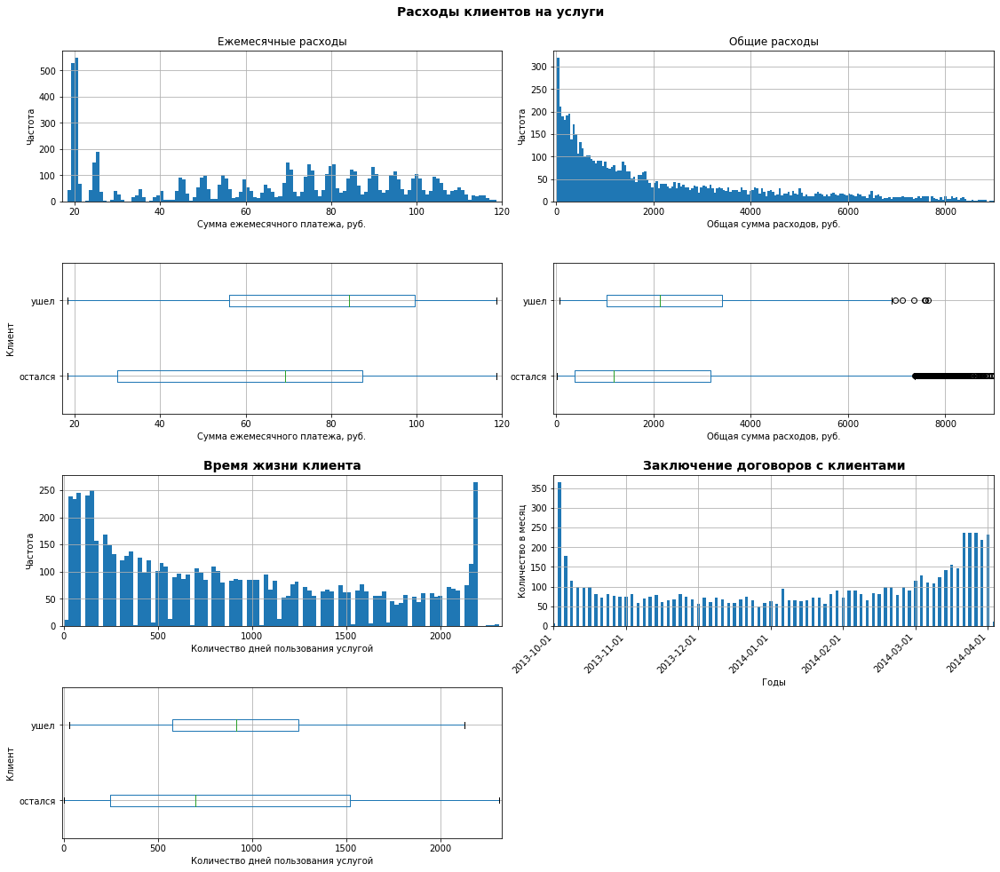

In [17]:
# отображение статистической информации
print('\nСтатистическая информация:')
display(round(data[data.select_dtypes(exclude=['category', 'int8']).columns].describe(datetime_is_numeric=True)))

# формирование вспомогательных датасетов для построения графиков
df1 = pd.concat([data['lifetime'].dt.days, data['outflow']], axis=1)
df2 = data['begin_date'].dt.date.groupby(data['begin_date'].dt.date).count()

# построение графиков
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16, 14))
data['monthly_charges'].hist(bins=120, ax=ax[0,0])
ax[0,0].set_title('Ежемесячные расходы')
ax[0,0].set_xlabel('Сумма ежемесячного платежа, руб.')
ax[0,0].set_xlim(17, 120)
ax[0,0].set_ylabel('Частота')
data['total_charges'].hist(bins=200, ax=ax[0,1])
ax[0,1].set_title('Общие расходы')
ax[0,1].set_xlabel('Общая сумма расходов, руб.')
ax[0,1].set_xlim(-50, 9000)
ax[0,1].set_ylabel('Частота')
data.boxplot(column='monthly_charges', by='outflow', vert=False, ax=ax[1,0])
ax[1,0].set_title('')
ax[1,0].set_xlabel('Сумма ежемесячного платежа, руб.')
ax[1,0].set_ylabel('Клиент')
ax[1,0].set_yticklabels(['остался', 'ушел'])
ax[1,0].set_xlim(17, 120)
data.boxplot(column='total_charges', by='outflow', vert=False, ax=ax[1,1])
ax[1,1].set_title('')
ax[1,1].set_xlabel('Общая сумма расходов, руб.')
ax[1,1].set_ylabel('')
ax[1,1].set_yticklabels(['остался', 'ушел'])
ax[1,1].set_xlim(-50, 9000)
df1['lifetime'].hist(bins=100, ax=ax[2,0])
ax[2,0].set_title('Время жизни клиента', fontweight='bold', fontsize=14)
ax[2,0].set_xlabel('Количество дней пользования услугой')
ax[2,0].set_xlim(-10, 2330)
ax[2,0].set_ylabel('Частота')
df2.plot(kind='bar', grid=True, ax=ax[2,1])
ax[2,1].set_title('Заключение договоров с клиентами', fontweight='bold', fontsize=14)
ax[2,1].set_xlim(3, 76)
ax[2,1].set_xlabel('Годы')
ax[2,1].set_xticks(np.arange(3, 76, 12))
ax[2,1].set_xticklabels(ax[2,1].get_xticklabels(), rotation=45, ha='right')
ax[2,1].set_ylabel('Количество в месяц')
df1.boxplot(column='lifetime', by='outflow', vert=False, ax=ax[3,0])
ax[3,0].set_title('')
ax[3,0].set_xlabel('Количество дней пользования услугой')
ax[3,0].set_ylabel('Клиент')
ax[3,0].set_yticklabels(['остался', 'ушел'])
ax[3,0].set_xlim(-10, 2330)
fig.suptitle('Расходы клиентов на услуги', fontweight='bold', fontsize=14)
fig.delaxes(ax[3,1])
fig.tight_layout(h_pad=0, w_pad=0, pad=2)
plt.show()

Ежемесячные расходы клиентов на услуги находятся в диапазоне от 18 до 119 рублей. Аномальных значений не наблюдается. Большое количество клиентов имеют небольшие расходы на уровне 20 рублей в месяц (на графике это отражается всплеском количества значений). В остальном диапазоне значений распределение непрерывное, без всплесков. Средние ежемесячные расходы составляют 65 руб., медианные - 70 рублей.

Общие расходы образуют неспадающий график. Такое распределение естественно, так как накопление общих расходов идет по мере увеличения времени жизни клиента, при этом всегда присутствует отток и подключение новых клиентов, прерывающий непрерывность такого накопления. В тоже время следует отметить, что есть и клиенты с большими значениями общих расходов, вплоть до 9 с лишним тысяч рублей. На гистограмме это сопровождается длинным наклоном вправо, а на boxplot выбросами в правой части. Также есть разброс между средним (2115 руб.) и медианным (1343 руб.) значениями. Это также показывает, что при наличии клиентов с довольно большими общими расходами и, соответственно, большим временем жизни, есть ещё бОльшое количество клиентов с небольшим общим платежом и, соответственно, временем жизни.

Этот факт подтверждает и график распределения времени жизни клиентов. На нем виден всплеск количества клиентов с максимальным временем жизни (2300 дней), при этом большое количество клиентов имеют время жизни до 500 дней, а среди них наибольшее количество имеет время жизни всего до 200 дней. Медианное значение в 761 день подтверждает такое распределение.

Отдельно следует отметить, что при сравнении портретов клиентов, расторгнувших договора и клиентов, остающимися пользователями услуг, видна тенденция к уходу клиентов с более высокими ежемесячными и общими платежами. Данная тенденция хорошо прослеживается на графиках boxplot, где сделано разделение клиентов по признаку оттока. Тенденция негативная, требует отдельного дополнительного анализа.

График распределения количества заключаемых договоров каждый месяц имеет довольно равномерную структуру, без существенных всплесков. Большой всплеск на первой дате исследуемого периода, предположительно, обусловлен внесением в систему учета этой датой договоров, заключенных более ранним периодом. Также наблюдается существенный рост количества заключаемых договоров в последние 5 месяцев исследуемого периода. Скорее всего, он тоже объясним какими-либо маркетинговыми, организационными или другими причинами.

### 2.6. <a id='toc2_6_'></a>[Корреляционный анализ](#toc0_)

В датасете большое количество бинарных и категориальных признаков, поэтому для корреляционного анализа построим матрицу на основе более универсального коэффициента Phi_K.

Матрица с коэффициентами корреляции Phik


,begin_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone,outflow,lifetime
begin_date,1.000000,0.754906,0.094972,0.450565,0.474474,0.841760,0.000000,0.059193,0.481849,0.201423,0.192651,0.413999,0.455463,0.461938,0.409183,0.369274,0.379218,0.437823,0.141994,0.000000,0.463194,0.998833
type,0.754906,1.000000,0.106860,0.277462,0.500064,0.568059,0.000000,0.086231,0.179736,0.147680,0.505187,0.152145,0.098884,0.137610,0.179999,0.066961,0.069608,0.065498,0.146647,0.000000,0.094015,0.722055
paperless_billing,0.094972,0.106860,1.000000,0.370495,0.459678,0.212585,0.000000,0.242133,0.013218,0.172593,0.231438,0.000000,0.196443,0.160796,0.055929,0.343524,0.325551,0.252972,0.482393,0.016811,0.083398,0.098566
payment_method,0.450565,0.277462,0.370495,1.000000,0.479301,0.424978,0.000000,0.292725,0.243008,0.224903,0.323886,0.262911,0.282475,0.306866,0.272101,0.377209,0.378907,0.339313,0.535120,0.000000,0.214832,0.425325
monthly_charges,0.474474,0.500064,0.459678,0.479301,1.000000,0.749594,0.000000,0.301178,0.213955,0.180973,0.974850,0.563643,0.628108,0.666076,0.588171,0.810932,0.807297,0.780277,0.998918,0.852422,0.232953,0.447504
total_charges,0.841760,0.568059,0.212585,0.424978,0.749594,1.000000,0.067399,0.152487,0.389746,0.092871,0.584040,0.508141,0.604727,0.627309,0.533254,0.627286,0.628955,0.576827,0.545445,0.153909,0.309366,0.874376
gender,0.000000,0.000000,0.000000,0.000000,0.000000,0.067399,1.000000,0.000000,0.000000,0.000000,0.000000,0.018397,0.009882,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008581,0.000000
senior_citizen,0.059193,0.086231,0.242133,0.292725,0.301178,0.152487,0.000000,1.000000,0.016992,0.324576,0.160702,0.057028,0.102065,0.090686,0.092565,0.163120,0.186141,0.221313,0.281853,0.000000,0.086159,0.096425
partner,0.481849,0.179736,0.013218,0.243008,0.213955,0.389746,0.000000,0.016992,1.000000,0.652122,0.000000,0.221673,0.219223,0.238079,0.185993,0.193258,0.182011,0.220101,0.000000,0.019540,0.226688,0.443152
dependents,0.201423,0.147680,0.172593,0.224903,0.180973,0.092871,0.000000,0.324576,0.652122,1.000000,0.108463,0.124945,0.031533,0.010416,0.096912,0.017331,0.058999,0.033103,0.216514,0.000000,0.046871,0.198390


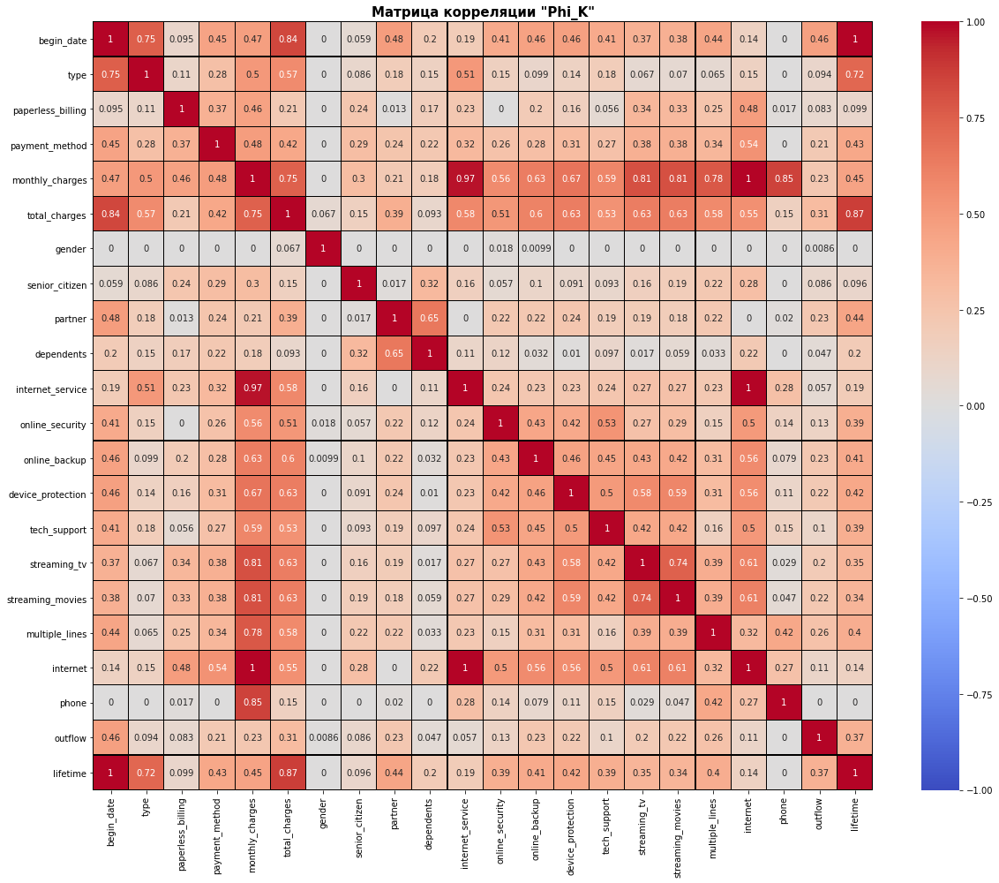

In [18]:
# уход от формата datetime перед построением матрицы корреляции,
# чтобы включить эти признаки в перечень непрерывных
data['lifetime'] = data['lifetime'].astype('timedelta64[D]').astype(int)
data['begin_date'] = (data['begin_date'] - pd.Timestamp('1970-01-01')) // pd.Timedelta('1s')

# построение матрицы с коэффициентом корреляции Phik
data_phik = data.phik_matrix(interval_cols=['monthly_charges', 'total_charges', 'begin_date', 'lifetime'], bins=50)
print('Матрица с коэффициентами корреляции Phik')
display(data_phik)

plt.figure(figsize=(17, 14))
sns.heatmap(data_phik, vmin=-1, vmax=+1, cmap='coolwarm', annot=True, linewidths=.1, linecolor='black')
plt.yticks(rotation=0)
plt.title('Матрица корреляции "Phi_K"', size=15, fontweight='bold')
plt.tight_layout()
plt.show()

При анализе матрицы прослеживается положительная корреляция между частью признаков. Особо высокая зависимость наблюдается между следующими признаками:
- `lifetime` и `begin_date` - Такая зависимость логична, так как на момент начала исследования клиентов с большим временем жизни не было, а по ходу периода исследования (увеличения даты заключения договора) клиентов с большим временем жизни становилось больше. На графике распределения ежемесячного количества заключаемых договоров интересных закономерностей не наблюдалось, кроме того, имелся выброс в начале графика. С точки зрения информативности при обучении модели, оставим параметр `lifetime`, исключив `begin_date`.
- `internet` и `internet_service` - Корреляция между этими признаками закономерна, так как признак `internet` содержится в признаке `internet_service` в виде параметра `No` (отсутствие технологии). Признак `internet` был введен нами сознательно, чтобы отследить влияние факта наличия услуги интернет на отток клиентов.
- `monthly_charges` и признаки наличия услуг (особенно с признаками `internet`, `internet_service` и `phone`) - Корреляция закономерна, так как наличие любой услуги у клиента означает увеличение его ежемесячного платежа.
- `total_charges` и `lifetime` - Это также закономерная корреляция. Чем дольше время жизни клиента, тем больше накапливается его платеж.

In [19]:
# удаление коррелирующего столбца begin_date
data = data.drop(['begin_date'], axis=1)

# просмотр итогового датасета перед обучением
df_info(data, 5)

<class 'pandas.core.frame.DataFrame'>
Index: 7043 entries, 7590-VHVEG to 3186-AJIEK
Data columns (total 21 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   type               7043 non-null   category
 1   paperless_billing  7043 non-null   int8    
 2   payment_method     7043 non-null   category
 3   monthly_charges    7043 non-null   float64 
 4   total_charges      7043 non-null   float64 
 5   gender             7043 non-null   category
 6   senior_citizen     7043 non-null   int8    
 7   partner            7043 non-null   int8    
 8   dependents         7043 non-null   int8    
 9   internet_service   7043 non-null   category
 10  online_security    7043 non-null   int8    
 11  online_backup      7043 non-null   int8    
 12  device_protection  7043 non-null   int8    
 13  tech_support       7043 non-null   int8    
 14  streaming_tv       7043 non-null   int8    
 15  streaming_movies   7043 non-null   int8    
 

,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,internet,phone,outflow,lifetime
customer_id,,,,,,,,,,,,,,,,,,,,,
7590-VHVEG,Month-to-month,1,Electronic check,29.85,31.04,Female,0,1,0,DSL,0,1,0,0,0,0,0,1,0,0,31
5575-GNVDE,One year,0,Mailed check,56.95,2071.84,Male,0,0,0,DSL,1,0,1,0,0,0,0,1,1,0,1036
3668-QPYBK,Month-to-month,1,Mailed check,53.85,226.17,Male,0,0,0,DSL,1,1,0,0,0,0,0,1,1,0,123
7795-CFOCW,One year,0,Bank transfer (automatic),42.30,1960.60,Male,0,0,0,DSL,1,0,1,1,0,0,0,1,0,0,1371
9237-HQITU,Month-to-month,1,Electronic check,70.70,353.50,Female,0,0,0,Fiber optic,0,0,0,0,0,0,0,1,1,0,153


### 2.7. <a id='toc2_7_'></a>[Вывод по результатам раздела 2](#toc0_)

Исходные данные успешно загружены и объединены в единый датасет. Количества записей (7043) должно быть достаточно для построения и обучения моделей.

В рамках предобработки данных выполнены следующие мероприятия:
- унификация названий столбцов;
- проверка на наличие дубликатов (дубликаты отсутствуют);
- заполнение пропусков;
- корректировка типов данных в соответствии с содержанием;
- добавление новых признаков (наличие услуг интернет и телефонии, время жизни клиента) и удаление неактуальных признаков (даты заключения и расторжения договора);
- сформирован целевой признак оттока клиентов `outflow`.

Анализ уникальных значений дискретных параметров и распределений непрерывных параметров показал отсутствие аномальных значений и существенных выбросов. Также обнаружена негативная тенденция склонности к оттоку клиентов с более высокими ежемесячными и общими платежами, которая требует отдельного исследования.

Корреляционный анализ показал наличие сильной положительной корреляции между некоторыми признаками, в частности между ежемесячными платежами и признаками наличия услуг, а также между общими платежами и временем жизни клиента. Данные зависимости объяснимы и закономерны, а участвующие в них признаки нужны для анализа, поэтому все перечисленные признаки сохранены для участия в дальнейшем исследовании.  
Корреляция между признаками и целевым признаком варьируется от отсутствующей до средней.

## 3. <a id='toc3_'></a>[Построение и обучение моделей](#toc0_)

### 3.1. <a id='toc3_1_'></a>[Разделение на выборки](#toc0_)

Выделим в отдельную выборку (`target`) целевой признак `outflow` и разделим предобработанные данные на обучающую и тестовую выборки. Размер тестовой выборки установим 25%.

In [20]:
# формирование выборок признаков и целевого признака
features = data.drop('outflow', axis=1)
target = data['outflow']

# разделение на обучающую и тестовую выборки
features_train, features_test, target_train, target_test = train_test_split(features, target,
                                                                            test_size=.25, random_state=RST,
                                                                            stratify=data['outflow'])
# вывод итоговой информации о выборках
print(f'''
Обучающая выборка (features_train, target_train):
    - признаки {features_train.shape};
    - целевой признак ({target_train.shape[0]})
        - баланс классов (процент расторгнувших договор): {target_train.mean():0.2%}.
Тестовая выборка (features_test, target_test):
    - признаки {features_test.shape};
    - целевой признак ({target_test.shape[0]})
        - баланс классов (процент расторгнувших договор): {target_test.mean():0.2%}.
''')


Обучающая выборка (features_train, target_train):
    - признаки (5282, 20);
    - целевой признак (5282)
        - баланс классов (процент расторгнувших договор): 15.64%.
Тестовая выборка (features_test, target_test):
    - признаки (1761, 20);
    - целевой признак (1761)
        - баланс классов (процент расторгнувших договор): 15.62%.



### 3.2. <a id='toc3_2_'></a>[Выбор моделей](#toc0_)

Целевой признак категориальный (задача бинарной классификации), для обучения и достижения требуемого качества предсказаний возьмем следующие модели:
- Модель опорных векторов. Эффективно работает на больших выборках и выборках с большим количеством параметров, при этом имеет высокую производительность. Из семейства моделей SVC выберем модель линейных опорных векторов (`LinearSVC`), как более быструю реализацию задачи классификации.
- Логистическая регрессия (`LogisticRegression`). Классическая модель классификации, позволяющая в большинстве случаев получить быструю оценку с хорошем качеством предсказаний.
- Модель градиентного бустинга (`LGBMClassifier`). Это ансамбль из простых моделей типа решающее дерево в котором каждая последующая базовая модель учитывает ошибку предудущей, тем самым минимизируя ошибку ансамбля. Градиентный бустинг `LightGBM` в отличии от других моделей градиентного бустинга строит несимметричные деревья ориентируясь на бОльшую величину градиента и имеет высокую скорость обучения, сохряняя при этом высокую точность.
- Модель градиентного бустинга (`CatBoostClassifier`). Модель является усовершенствованной реализацией Gradient Boosting Decision Trees (GBDT), имеет поддержку категориальных переменных и за счет решения проблемы смещения градиента (Gradient Bias) и смещения предсказания (Prediction Shift) позволяет уменьшить вероятность переобучения и обеспечивает высокую точность алгоритма.

Категориальные признаки в основном бинарные и содержат не более 4 категорий, поэтому для кодирования достаточно применения `OneHotEncoder`, который в этом случае не будет утяжелять выборку дополнительными признаками. Масштабирование количественных признаков будем осуществлять с помощью `StandardScaler`.

Подбор гиперпараметров осуществим с помощью `GridSearchCV` и кросс-валидации. Для создания сквозного процесса используем пайплайн (`Pipeline`).

В качестве метрики будем использовать AUC-ROC, результирующее значение которой должно быть не меньше 0,85.

Для обучения моделей, подбора гиперпараметров, измерения AUC-ROC и времени обучения создадим пользовательскую функцию `model_fit`.

In [21]:
# функция обучения модели
# на входе: созданная модель, выборки признаков и целевого признака,
# гиперпараметры для подбора и количество итераций кроссвалидации
# на выходе: обученная модель, её лучшее значение AUC-ROC, параметры и время обучения
def model_fit(model_type, features, target, param_grid, cv):
    # засекаем время
    start_time = time.time()
    # подготовка масштабирования и кодирования
    transformer = ColumnTransformer([
        ('num', StandardScaler(), make_column_selector(dtype_include=['float64', 'int64'])),
        ('cat', OneHotEncoder(), make_column_selector(dtype_include=['category', 'int8']))
        ])
    # создание пайплайн
    pipe = Pipeline([
        ('transformer', transformer),
        ('classifier', model_type)
        ])
    # подбор гиперпараметров с использованием кросс-валидации
    model = GridSearchCV(pipe, param_grid=param_grid, scoring='roc_auc', cv=cv, n_jobs=-1, verbose=2)
    model.fit(features, target)
    auc_roc = model.best_score_
    param = model.best_params_
    # подсчет времени выполнения
    time_fit = time.time() - start_time
    # вывод результатов
    print(f'''
Лучшие гиперпараметры:{pd.DataFrame.from_dict(param, orient='index').rename(columns={0:''})}
Значение AUC-ROC: {auc_roc:0.3f}
Время обучения: {time_fit:0.1f} сек. ({time.strftime("%H:%M:%S", time.gmtime(time_fit))})''')
    return model, auc_roc, param, time_fit

### 3.3. <a id='toc3_3_'></a>[Метод опорных векторов LinearSVC](#toc0_)

Осуществим подбор гиперпараметров, оказывающих основное влияние на результат модели: параметр регуляризации `C`, максимальное количество итераций `max_iter`, допуск критерия остановки `tol`.

In [22]:
print('Модель "метод опорных векторов"')
# гиперпараметры и их диапазоны для подбора
param_grid = [{
    'classifier__C': [.5, 1, 2, 4, 6, 8],
    'classifier__tol': [.01, .1, 1, 2],
    'classifier__max_iter': [1000, 2000, 4000]
    }]

svc_mod, svc_auc_roc, svc_param, svc_time_fit = model_fit(LinearSVC(random_state=RST), 
                                                          features_train, target_train, param_grid, 5)

Модель "метод опорных векторов"
Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.1s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.3s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.2s
[CV] END classifier__C=0.5, classifier__max_it

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.8s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.8s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.6s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.8s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.6s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=1; total time=   0.3s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=4, classifier__max_iter=1000, classifier__tol=2; total time=   

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.1s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.01; total time=   0.8s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.7s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.6s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.6s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.8s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.5s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=1; total time=   0.3s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=1; total time=   0.3s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=4, classifier__max_iter=2000, classifier__tol=1; to

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.8s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.8s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.8s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.8s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=1; total time=   0.6s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=6, classifier__max_iter=1000, classifier__tol=2; total time=   0.

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.3s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.3s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.3s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.2s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.7s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.7s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.7s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.8s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.6s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=6, classifier__max_iter=2000, classifier__tol=1; to

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.01; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.6s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.7s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=0.1; total time=   0.6s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=1; total time=   0.6s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=1; total time=   0.6s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=1; total time=   0.6s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=8, classifier__max_iter=1000, classifier__tol=2; total time=   0.

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.1s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.1s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.2s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.0s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.01; total time=   1.1s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.9s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.8s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.9s


/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.1; total time=   1.1s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=0.1; total time=   0.9s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=1; total time=   0.6s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=1; total time=   0.4s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=2; total time=   0.3s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=2; total time=   0.4s
[CV] END classifier__C=8, classifier__max_iter=2000, classifier__tol=2; total time=   

/opt/conda/lib/python3.9/site-packages/sklearn/svm/_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.01; total time=   1.9s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.01; total time=   1.2s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.1; total time=   0.8s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.1; total time=   1.0s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.1; total time=   0.9s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.1; total time=   1.0s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=0.1; total time=   0.9s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=1; total time=   0.5s
[CV] END classifier__C=8, classifier__max_iter=4000, classifier__tol=1; to

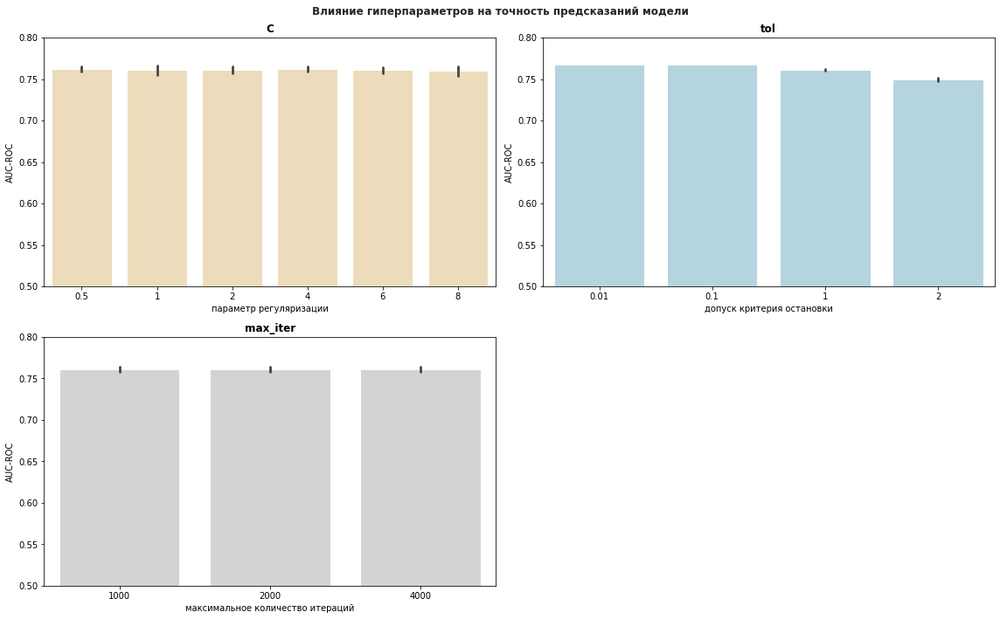

In [23]:
# построение графиков влияния подбираемых гиперпараметров на модель
res_svc = pd.DataFrame(svc_mod.cv_results_).sort_values(by='rank_test_score')
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style("whitegrid")
fig.suptitle('Влияние гиперпараметров на точность предсказаний модели', fontweight='bold')
sns.barplot(x='param_classifier__C', y='mean_test_score', data=res_svc, ax=axes[0,0], color='wheat')
axes[0,0].set (xlabel='параметр регуляризации', ylabel='AUC-ROC')
axes[0,0].set_title(label = 'C', fontweight='bold')
axes[0,0].set_ylim([.5, .8])
sns.barplot(x='param_classifier__tol', y='mean_test_score', data=res_svc, ax=axes[0,1], color='lightblue')
axes[0,1].set (xlabel='допуск критерия остановки', ylabel='AUC-ROC')
axes[0,1].set_title(label = 'tol', fontweight='bold')
axes[0,1].set_ylim([.5, .8])
sns.barplot(x='param_classifier__max_iter', y='mean_test_score', data=res_svc, ax=axes[1,0], color='lightgrey')
axes[1,0].set (xlabel='максимальное количество итераций', ylabel='AUC-ROC')
axes[1,0].set_title(label = 'max_iter', fontweight='bold')
axes[1,0].set_ylim([.5, .8])
fig.delaxes(axes[1,1])
fig.tight_layout()
plt.show()

Влияние гиперпараметров на точность предсказаний модели:
- параметр регуляризации (`C`) - изменение данного гиперпараметра оказывает разнонаправленное влияние на точность модели, закономерность отсутствует, лучшее значение точности получено при значении гиперпараметра равном 6;
- максимальное количество итераций (`max_iter`) - изменение гиперпараметра не оказывает влияние на точность модели;
- допуск критерия остановки (`tol`) - при увеличении значения гиперпараметра выше 0,1, точность модели ухудшается; при уменьшении значения ниже 0,1 точность не меняется.

Качество предсказаний модели опорных векторов (0,767) существенно ниже требуемого (0,85).

Попробуем улучшить результат с помощью ещё одной линейной модели - логистической регрессии.

### 3.4. <a id='toc3_4_'></a>[Логистическая регрессия](#toc0_)

При обучении модели логистической регрессии осуществим подбор двух гиперпараметров: тип алгоритма `solver` и максимальное количество итераций `max_iter`.

In [24]:
print('Модель "логистическая регрессия"')
# гиперпараметры для подбора
param_grid = [{
    'classifier__solver': ['liblinear', 'sag'],
    'classifier__max_iter': [100, 200, 400]
    }]

lr_mod, lr_auc_roc, lr_param, lr_time_fit = model_fit(LogisticRegression(random_state=RST, class_weight='balanced'),
                                                 features_train, target_train, param_grid, 5)

Модель "логистическая регрессия"
Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END classifier__max_iter=100, classifier__solver=liblinear; total time=   0.2s
[CV] END classifier__max_iter=100, classifier__solver=liblinear; total time=   0.1s
[CV] END classifier__max_iter=100, classifier__solver=liblinear; total time=   0.2s
[CV] END classifier__max_iter=100, classifier__solver=liblinear; total time=   0.2s
[CV] END classifier__max_iter=100, classifier__solver=liblinear; total time=   0.2s
[CV] END ...classifier__max_iter=100, classifier__solver=sag; total time=   0.4s
[CV] END ...classifier__max_iter=100, classifier__solver=sag; total time=   0.3s
[CV] END ...classifier__max_iter=100, classifier__solver=sag; total time=   0.5s
[CV] END ...classifier__max_iter=100, classifier__solver=sag; total time=   0.5s
[CV] END ...classifier__max_iter=100, classifier__solver=sag; total time=   0.5s
[CV] END classifier__max_iter=200, classifier__solver=liblinear; total time=   0.2

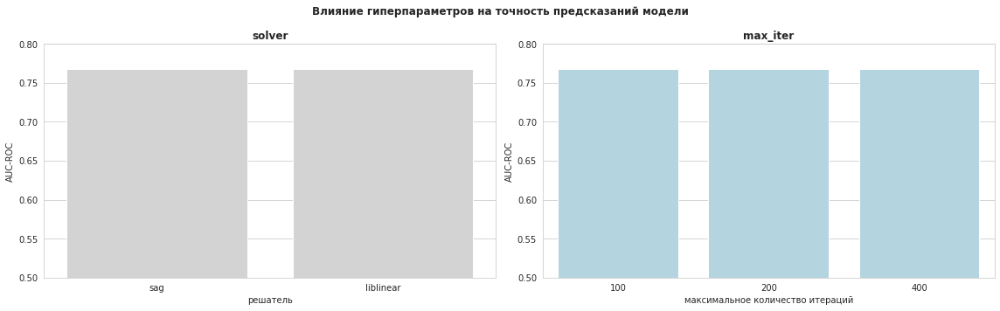

In [25]:
# построение графиков влияния подбираемых гиперпараметров на модель
res_lr = pd.DataFrame(lr_mod.cv_results_).sort_values(by='rank_test_score')
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
sns.set_style("whitegrid")
fig.suptitle('Влияние гиперпараметров на точность предсказаний модели', fontweight='bold')
sns.barplot(x='param_classifier__solver', y='mean_test_score', data=res_lr, ax=axes[0], color='lightgrey')
axes[0].set (xlabel='решатель', ylabel='AUC-ROC')
axes[0].set_title(label = 'solver', fontweight='bold')
axes[0].set_ylim([.5, .8])
sns.barplot(x='param_classifier__max_iter', y='mean_test_score', data=res_lr, ax=axes[1], color='lightblue')
axes[1].set (xlabel='максимальное количество итераций', ylabel='AUC-ROC')
axes[1].set_title(label = 'max_iter', fontweight='bold')
axes[1].set_ylim([.5, .8])
fig.tight_layout()
plt.show()

По графикам видно, что изменение гиперпараметров не приводит к изменению точности модели.

Точность предсказаний модели логистической регрессии такая же как у модели опорных векторов. Обучение модели прошло значительно быстрее, чем предыдущей, но результат не соответствует требуемому (AUC-ROC = 0,767 при нормативе 0,85).

Перейдем к обучению и получению предсказаний для моделей градиентного бустинга.

### 3.5. <a id='toc3_5_'></a>[Градиентный бустинг LGBMClassifier](#toc0_)

Осуществим подбор гиперпараметров, оказывающих основное влияние на результат модели: скорость обучения (`learning_rate`), максимальная глубина дерева (`max_depth`), количество деревьев (`n_estimators`).

In [26]:
print('Модель градиентный бустинг LGBMClassifier')
# гиперпараметры и их диапазоны для подбора
param_grid = [{
    'classifier__learning_rate': [.1, .2, .4, .8, 1],
    'classifier__max_depth': [1, 2, 3, 7],
    'classifier__n_estimators': [200, 400, 600, 800]
    }]

lgbmc_mod, lgbmc_auc_roc, lgbmc_param, lgbmc_time_fit = model_fit(LGBMClassifier(random_state=RST, num_threads=1, n_jobs=None), 
                                                               features_train, target_train, param_grid, 5)

Модель градиентный бустинг LGBMClassifier
Fitting 5 folds for each of 80 candidates, totalling 400 fits
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=200; total time=   0.2s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=200; total time=   0.2s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=200; total time=   0.2s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=200; total time=   0.2s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=200; total time=   0.1s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=400; total time=   0.3s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=400; total time=   0.3s
[CV] END classifier__learning_rate=0.1, classifier__max_depth=1, classifier__n_estimators=400; tot

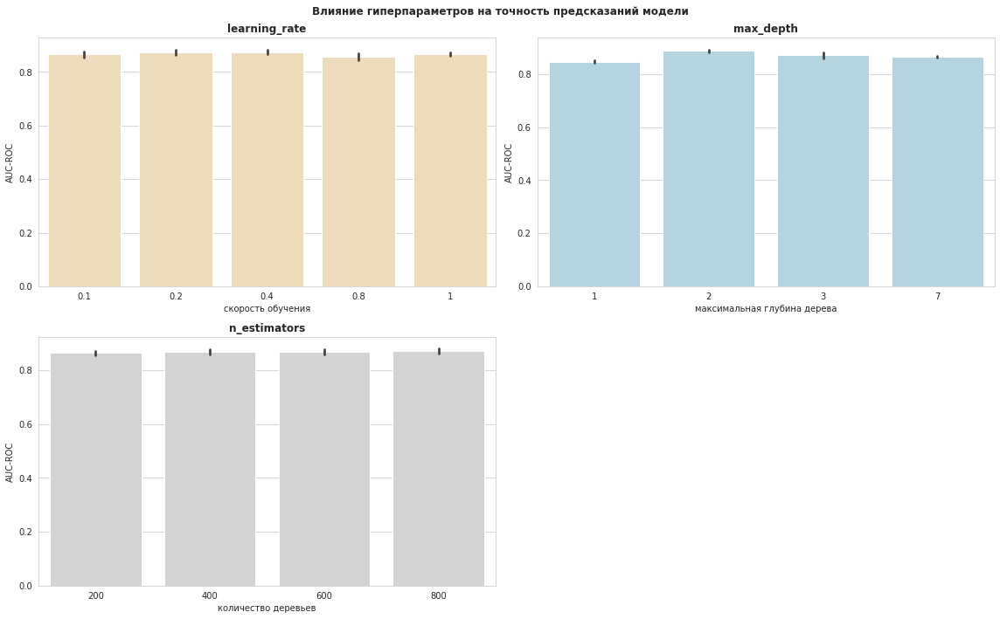

In [27]:
# построение графиков влияния подбираемых гиперпараметров на модель
res_lgbmc = pd.DataFrame(lgbmc_mod.cv_results_).sort_values(by='rank_test_score')
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style("whitegrid")
fig.suptitle('Влияние гиперпараметров на точность предсказаний модели', fontweight='bold')
sns.barplot(x='param_classifier__learning_rate', y='mean_test_score', data=res_lgbmc, ax=axes[0,0], color='wheat')
axes[0,0].set (xlabel='скорость обучения', ylabel='AUC-ROC')
axes[0,0].set_title(label = 'learning_rate', fontweight='bold')
sns.barplot(x='param_classifier__max_depth', y='mean_test_score', data=res_lgbmc, ax=axes[0,1], color='lightblue')
axes[0,1].set (xlabel='максимальная глубина дерева', ylabel='AUC-ROC')
axes[0,1].set_title(label = 'max_depth', fontweight='bold')
sns.barplot(x='param_classifier__n_estimators', y='mean_test_score', data=res_lgbmc, ax=axes[1,0], color='lightgrey')
axes[1,0].set (xlabel='количество деревьев', ylabel='AUC-ROC')
axes[1,0].set_title(label = 'n_estimators', fontweight='bold')
fig.delaxes(axes[1,1])
fig.tight_layout()
plt.show()

Влияние гиперпараметров на точность предсказаний модели:
- скорость обучения (`learning_rate`) - при увеличение значения гиперпараметра идет улучшение точности предсказаний модели, при значениях 0,2 - 0,4 точность модели максимальна, дальнейшее увеличение значения гиперпараметра приводит к снижению точности модели;
- максимальная глубина дерева (`max_depth`) - лучшая точность модели получается при значении гаперпараметра равном 2, дальнейшее увеличение значения гиперпараметра ухудшает точность модели;
- количество деревьев (`n_estimators`) - увеличение значения гиперпараметра приводит к улучшению качества предсказания модели, при достижении значений 400 - 600 достигает насыщения, после чего дальнейшее увеличение значения гиперпараметра нецелесообразно.

Качество предсказаний модели градиентного бустинга LGBMClassifier (0,901) соответствует требуемому (AUC-ROC > 0,85).

### 3.6. <a id='toc3_6_'></a>[Градиентный бустинг CatBoostClassifier](#toc0_)

Осуществим подбор гиперпараметров, оказывающих основное влияние на результат модели: скорость обучения (`learning_rate`), максимальная глубина дерева (`depth`), количество деревьев (`iterations`).

In [28]:
print('Модель градиентный бустинг CatBoostClassifier')
# гиперпараметры и их диапазоны для подбора
param_grid = [{
    'classifier__learning_rate': [.1, .3, .6, .8],
    'classifier__depth': [2, 4, 6],
    'classifier__iterations': [100, 200, 400, 600]
    }]

cbc_mod, cbc_auc_roc, cbc_param, cbc_time_fit = model_fit(CatBoostClassifier(random_seed=RST), 
                                                               features_train, target_train, param_grid, 5)

Модель градиентный бустинг CatBoostClassifier
Fitting 5 folds for each of 48 candidates, totalling 240 fits
0:	learn: 0.6269184	total: 48.2ms	remaining: 4.77s
1:	learn: 0.5773100	total: 49.8ms	remaining: 2.44s
2:	learn: 0.5393891	total: 52.2ms	remaining: 1.69s
3:	learn: 0.5105727	total: 54.6ms	remaining: 1.31s
4:	learn: 0.4856579	total: 55.7ms	remaining: 1.06s
5:	learn: 0.4670070	total: 57.1ms	remaining: 894ms
6:	learn: 0.4472520	total: 58.3ms	remaining: 775ms
7:	learn: 0.4323371	total: 59.5ms	remaining: 685ms
8:	learn: 0.4236790	total: 63.5ms	remaining: 642ms
9:	learn: 0.4153473	total: 64.8ms	remaining: 583ms
10:	learn: 0.4084197	total: 65.9ms	remaining: 533ms
11:	learn: 0.4038409	total: 67ms	remaining: 491ms
12:	learn: 0.3954296	total: 68.2ms	remaining: 456ms
13:	learn: 0.3893656	total: 69.4ms	remaining: 426ms
14:	learn: 0.3844890	total: 72.9ms	remaining: 413ms
15:	learn: 0.3808481	total: 74.1ms	remaining: 389ms
16:	learn: 0.3779051	total: 75.3ms	remaining: 368ms
17:	learn: 0.3750712

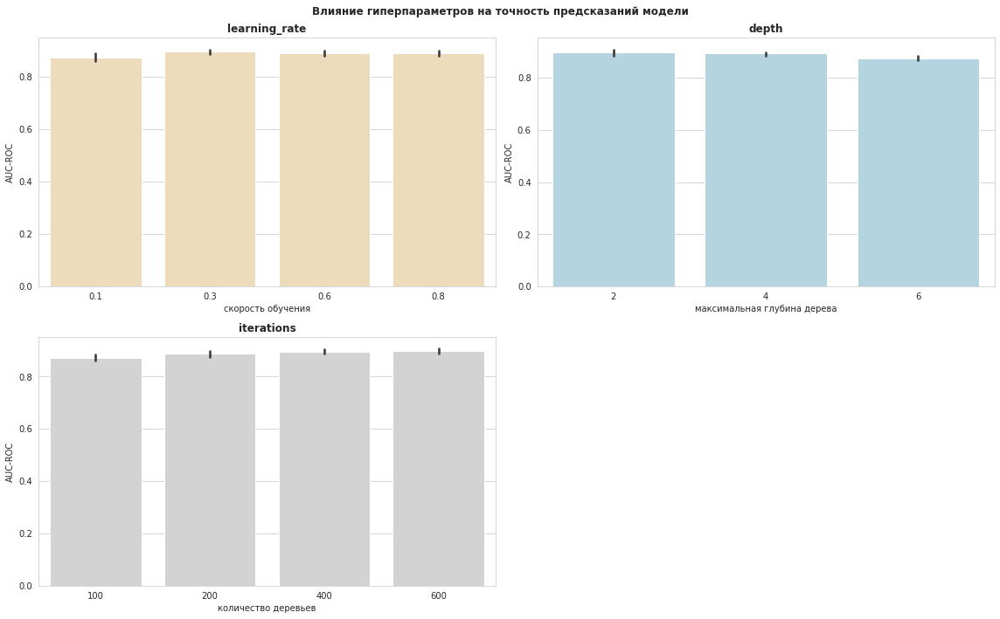

In [29]:
# построение графиков влияния подбираемых гиперпараметров на модель
res_cbc = pd.DataFrame(cbc_mod.cv_results_).sort_values(by='rank_test_score')
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style("whitegrid")
fig.suptitle('Влияние гиперпараметров на точность предсказаний модели', fontweight='bold')
sns.barplot(x='param_classifier__learning_rate', y='mean_test_score', data=res_cbc, ax=axes[0,0], color='wheat')
axes[0,0].set (xlabel='скорость обучения', ylabel='AUC-ROC')
axes[0,0].set_title(label = 'learning_rate', fontweight='bold')
sns.barplot(x='param_classifier__depth', y='mean_test_score', data=res_cbc, ax=axes[0,1], color='lightblue')
axes[0,1].set (xlabel='максимальная глубина дерева', ylabel='AUC-ROC')
axes[0,1].set_title(label = 'depth', fontweight='bold')
sns.barplot(x='param_classifier__iterations', y='mean_test_score', data=res_cbc, ax=axes[1,0], color='lightgrey')
axes[1,0].set (xlabel='количество деревьев', ylabel='AUC-ROC')
axes[1,0].set_title(label = 'iterations', fontweight='bold')
fig.delaxes(axes[1,1])
fig.tight_layout()
plt.show()

Влияние гиперпараметров на точность предсказаний модели:
- скорость обучения (`learning_rate`) - при увеличение значения гиперпараметра идет улучшение точности предсказаний модели, при значении 0,6 точность модели максимальна, дальнейшее увеличение значения гиперпараметра приводит к уменьшению точности модели;
- максимальная глубина дерева (`depth`) - лучшая точность модели получается при значении гаперпараметра равном 2, дальнейшее увеличение значения гиперпараметра ухудшает точность модели;
- количество деревьев (`iterations`) - увеличение значения гиперпараметра приводит к улучшению качества предсказания модели, при достижении значений 400 - 600 достигает насыщения, после чего дальнейшее увеличение значения гиперпараметра нецелесообразно.

Качество предсказаний модели градиентного бустинга CatBoostClassifier (0,919) соответствует требуемому (AUC-ROC > 0,85).

#### 3.6.1. <a id='toc3_6_1_'></a>[CatBoostClassifier, использование встроенных средств предобработки признаков](#toc0_)

Модель CatBoost имеет встроенные средства работы с категориальными и другими типами данных, поэтому при работе с данной моделью категориальные данные не требуют предварительного кодирования.

Проверим это на практике. Обучим ещё одну модель градиентного бустинга CatBoostClassifier исключив пайплайн с предварительным кодированием и масштабированием признаков. Для подбора параметров оставим GridSearchCV с кросс-валидацией и тем же набором гиперпараметров.

In [74]:
# засекаем время
start_time = time.time()
# список категориальных признаков    
cat_feat = [features_train.columns.get_loc(c) for c in features_train.select_dtypes(include='category')]
# создание модели
model = CatBoostClassifier(cat_features=cat_feat, random_seed=RST)
# гипарпараметры для подбора
grid = {
    'learning_rate': [.1, .3, .6, .8],
    'depth': [2, 4, 6],
    'iterations': [100, 200, 400, 600]
    }
# подбор гиперпараметров с использованием кросс-валидации
cbc2_mod = GridSearchCV(model, param_grid=grid, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)
cbc2_mod.fit(features_train, target_train)
cbc2_auc_roc = cbc2_mod.best_score_
cbc2_param = cbc2_mod.best_params_
# подсчет времени выполнения
cbc2_time_fit = time.time() - start_time
# вывод результатов
print(f'''
Лучшие гиперпараметры:{pd.DataFrame.from_dict(cbc2_param, orient='index').rename(columns={0:''})}
Значение AUC-ROC: {cbc2_auc_roc:0.3f}
Время обучения: {cbc2_time_fit:0.1f} сек. ({time.strftime("%H:%M:%S", time.gmtime(cbc2_time_fit))})''')

Fitting 5 folds for each of 48 candidates, totalling 240 fits
0:	learn: 0.6325426	total: 2.35ms	remaining: 232ms
1:	learn: 0.5818499	total: 4.81ms	remaining: 236ms
2:	learn: 0.5413478	total: 6.95ms	remaining: 225ms
3:	learn: 0.5075182	total: 9.31ms	remaining: 224ms
4:	learn: 0.4799806	total: 11.4ms	remaining: 217ms
5:	learn: 0.4605020	total: 13.6ms	remaining: 212ms
6:	learn: 0.4462077	total: 15.7ms	remaining: 208ms
7:	learn: 0.4297576	total: 18.1ms	remaining: 208ms
8:	learn: 0.4203990	total: 20.2ms	remaining: 204ms
9:	learn: 0.4120538	total: 22.5ms	remaining: 202ms
10:	learn: 0.4045754	total: 24.5ms	remaining: 198ms
11:	learn: 0.4002366	total: 26.6ms	remaining: 195ms
12:	learn: 0.3952828	total: 28.9ms	remaining: 193ms
13:	learn: 0.3911560	total: 31.1ms	remaining: 191ms
14:	learn: 0.3845674	total: 33.4ms	remaining: 189ms
15:	learn: 0.3797625	total: 35.5ms	remaining: 187ms
16:	learn: 0.3763702	total: 37.5ms	remaining: 183ms
17:	learn: 0.3732461	total: 39.5ms	remaining: 180ms
18:	learn: 0

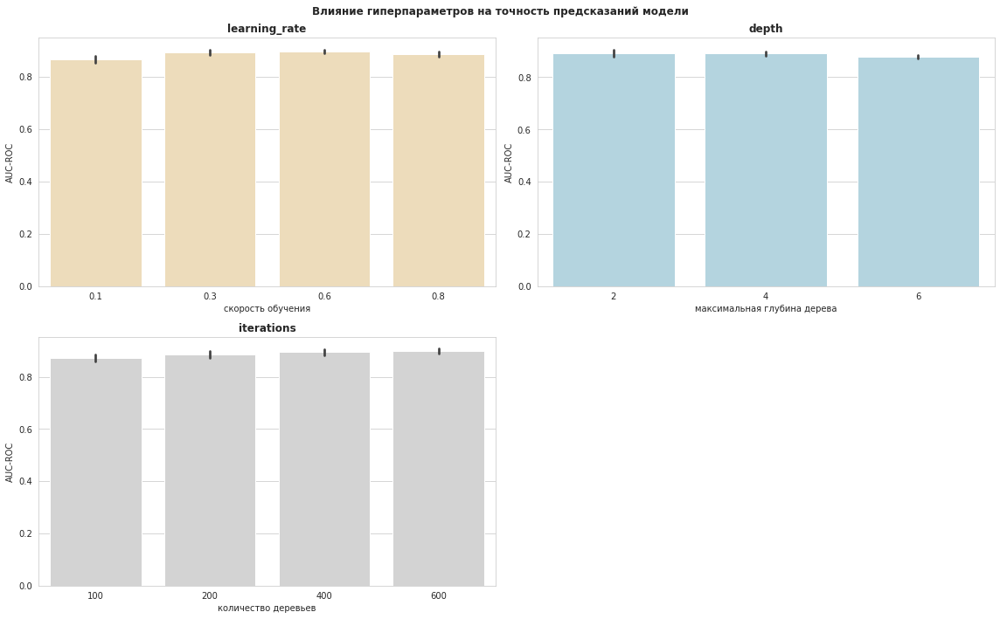

In [31]:
# построение графиков влияния подбираемых гиперпараметров на модель
res_cbc2 = pd.DataFrame(cbc2_mod.cv_results_).sort_values(by='rank_test_score')
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style("whitegrid")
fig.suptitle('Влияние гиперпараметров на точность предсказаний модели', fontweight='bold')
sns.barplot(x='param_learning_rate', y='mean_test_score', data=res_cbc2, ax=axes[0,0], color='wheat')
axes[0,0].set (xlabel='скорость обучения', ylabel='AUC-ROC')
axes[0,0].set_title(label = 'learning_rate', fontweight='bold')
sns.barplot(x='param_depth', y='mean_test_score', data=res_cbc2, ax=axes[0,1], color='lightblue')
axes[0,1].set (xlabel='максимальная глубина дерева', ylabel='AUC-ROC')
axes[0,1].set_title(label = 'depth', fontweight='bold')
sns.barplot(x='param_iterations', y='mean_test_score', data=res_cbc2, ax=axes[1,0], color='lightgrey')
axes[1,0].set (xlabel='количество деревьев', ylabel='AUC-ROC')
axes[1,0].set_title(label = 'iterations', fontweight='bold')
fig.delaxes(axes[1,1])
fig.tight_layout()
plt.show()

Результат получился такой же (0,919), как и при обучении CatBoostClassifier в пайплайте с предварительным кодированием и масштабированием признаков.

#### 3.6.2. <a id='toc3_6_2_'></a>[CatBoostClassifier, использование Pool](#toc0_)

В качестве изучения `CatBoostClassifier` после сдачи проекта попробовал использовать `Pool`, но пока не вижу в нем смысла, так как ни в `.grid_search`, ни в `GridSearchCV` его не удается вставить, там в обоих случаях используются отдельные выборки признаков и целевого признака и массив `Pool` не подходит.

В конечном итоге просто запустил `CatBoostClassifier` с `.grid_search`. Результат:
- обучение на том же наборе гиперпараметров и количестве кросс-валидаций стало почти в 6 раз быстрее, чем в комбинации `CatBoostClassifier`+`GridSearchCV` (85 секунд против 500);
- значение на обучающей выборке лучше - 0,924;
- значение на тестовой выборке хуже - 0,937.

In [70]:
# засекаем время
start_time = time.time()
# список категориальных признаков    
cat_feat = list(features_train.select_dtypes(include=['category', 'int8']).columns)
# создание Pool
#pool = Pool(data=features_train, label=target_train, cat_features=cat_feat)

# создание модели
model = CatBoostClassifier(cat_features=cat_feat, eval_metric='AUC', random_seed=RST)
# гипарпараметры для подбора
grid = {
    'learning_rate': [.1, .3, .6, .8],
    'depth': [2, 4, 6],
    'iterations': [100, 200, 400, 600]
    }
# подбор гиперпараметров с использованием кросс-валидации
cbc3_mod = model.grid_search(grid, X=features_train, y=target_train, cv=5, stratified=True, 
                             partition_random_seed=RST, plot=True)
#cbc3_mod = GridSearchCV(model, param_grid=grid, scoring='roc_auc', cv=5, n_jobs=-1, verbose=2)
#cbc3_mod.fit(pool)
cbc3_auc_roc = str(model.get_best_score())
cbc3_param = model.get_params()
# подсчет времени выполнения
cbc3_time_fit = time.time() - start_time
# вывод результатов
#print(f'''
#Лучшие гиперпараметры:{pd.DataFrame.from_dict(cbc3_param, orient='index').rename(columns={0:''})}
#Значение AUC-ROC: {cbc3_auc_roc:0.3f}
print(f'''
Время обучения: {cbc3_time_fit:0.1f} сек. ({time.strftime("%H:%M:%S", time.gmtime(cbc3_time_fit))})
''')

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	test: 0.6755986	best: 0.6755986 (0)	total: 2.76ms	remaining: 274ms
1:	test: 0.7492501	best: 0.7492501 (1)	total: 5.5ms	remaining: 269ms
2:	test: 0.7623031	best: 0.7623031 (2)	total: 7.62ms	remaining: 246ms
3:	test: 0.7601773	best: 0.7623031 (2)	total: 9.62ms	remaining: 231ms
4:	test: 0.7702809	best: 0.7702809 (4)	total: 12ms	remaining: 227ms
5:	test: 0.7678203	best: 0.7702809 (4)	total: 14ms	remaining: 219ms
6:	test: 0.7799963	best: 0.7799963 (6)	total: 16ms	remaining: 212ms
7:	test: 0.8023997	best: 0.8023997 (7)	total: 18.1ms	remaining: 208ms
8:	test: 0.8138492	best: 0.8138492 (8)	total: 20.2ms	remaining: 205ms
9:	test: 0.8101063	best: 0.8138492 (8)	total: 22.2ms	remaining: 200ms
10:	test: 0.8128582	best: 0.8138492 (8)	total: 24.4ms	remaining: 197ms
11:	test: 0.8108931	best: 0.8138492 (8)	total: 26.3ms	remaining: 193ms
12:	test: 0.8094100	best: 0.8138492 (8)	total: 28.5ms	remaining: 191ms
13:	test: 0.8138759	best: 0.8138759 (13)	total: 30.6ms	remaining: 188ms
14:	test: 0.8269491	be

In [73]:
print(f'Значение AUC-ROC на тестовой выборке: {roc_auc_score(target_test, model.predict_proba(features_test)[:, 1]):0.3f}')

Значение AUC-ROC на тестовой выборке: 0.937


### 3.7. <a id='toc3_7_'></a>[Проверка на тестовой выборке](#toc0_)

Соберем результаты моделей в одну таблицу для сравнения и выбора лучшей.

In [32]:
models = pd.DataFrame(data=[
    [svc_time_fit, svc_mod.refit_time_, svc_auc_roc],
    [lr_time_fit, lr_mod.refit_time_, lr_auc_roc],
    [lgbmc_time_fit, lgbmc_mod.refit_time_, lgbmc_auc_roc],
    [cbc_time_fit, cbc_mod.refit_time_, cbc_auc_roc],
    [cbc2_time_fit, cbc2_mod.refit_time_, cbc2_auc_roc]],
                      index=['метод опорных векторов (LinearSVC)',
                             'логистическая регрессия (LogisticRegression)',
                             'градиентный бустинг (LGBMClassifier)',
                             'градиентный бустинг (CatBoostClassifier)',
                             'градиентный бустинг (CatBoostClassifier)'],
                      columns=['общее время обучения, сек.', 'время обучения на лучших гиперпараметрах, сек', 
                               'качество предсказаний (AUC-ROC)']).round(
    {'общее время обучения, сек.': 1, 'время обучения на лучших гиперпараметрах, сек': 2, 'качество предсказаний (AUC-ROC)': 4})
display(models)

,"общее время обучения, сек.","время обучения на лучших гиперпараметрах, сек",качество предсказаний (AUC-ROC)
метод опорных векторов (LinearSVC),172.9,0.86,0.7675
логистическая регрессия (LogisticRegression),10.6,0.41,0.7674
градиентный бустинг (LGBMClassifier),189.3,0.63,0.9011
градиентный бустинг (CatBoostClassifier),539.4,2.08,0.9194
градиентный бустинг (CatBoostClassifier),990.0,5.81,0.9192


- Две модели: опорных векторов (LinearSVC) и логистическая регрессия (LogisticRegression) не укладываются в требуемый норматив по показателю AUC-ROC. При этом модель логистической регрессии обучается значительно быстрее.
- Две модели градиентного бустинга: LGBMClassifier и CatBoostClassifier укладываются в норматив AUC-ROC > 0,85.
- Модель градиентного бустинга LGBMClassifier при незначительно меньшей точности показала гораздо более высокую скорость обучения чем модель CatBoostClassifier.
- Результат обучения модели CatBoostClassifier с предварительным кодированием/масштабированием и без него одинаковый. Время обучения без предварительного кодирования/масштабирования больше (возможно влияние нагрузки на общей платформе ЯндексПрактикум, на которой осуществлялось обучение моделей). 

Лучшей по качеству предсказаний является модель градиентного бустинга `CatBoostClassifier` со значением AUC-ROC = 0,919. Проверим её на тестовой выборке.

In [33]:
print(f'Значение AUC-ROC на тестовой выборке: {roc_auc_score(target_test, cbc_mod.predict_proba(features_test)[:, 1]):0.3f}')

Значение AUC-ROC на тестовой выборке: 0.942


Качество предсказаний модели на тестовой выборке выше, чем на обучающей и соответствует требованию AUC-ROC > 0,85.

### 3.8. <a id='toc3_8_'></a>[Исследование влияния признаков](#toc0_)

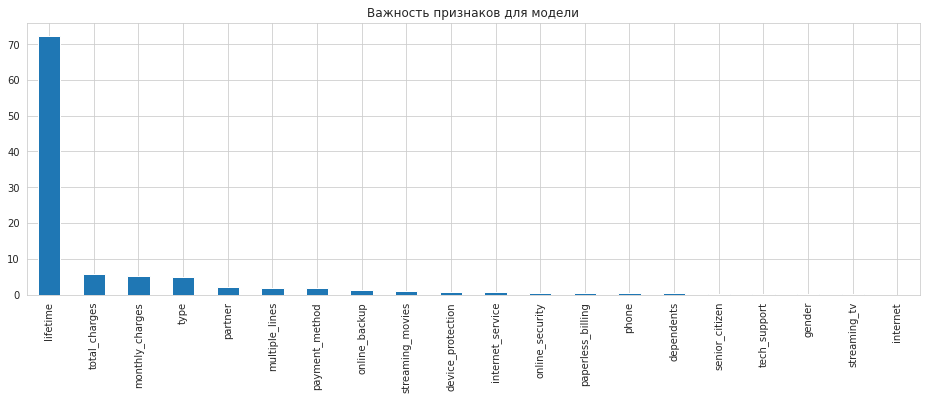

In [34]:
# построение графика влияния признаков
pd.Series(cbc2_mod.best_estimator_.feature_importances_, features_train.columns
         ).sort_values(ascending=False).plot(kind='bar', figsize=(16,5), title='Важность признаков для модели')
plt.show()

Основное и существенное влияние на модель оказывает признак "время жизни клиента" `lifetime`. Далее по важности идут три признака, связанных с оплатой услуг: общие расходы клиента, ежемесячные расходы и способ оплаты услуг. Влияние остальных признаков горазде менее значительно.

### 3.9. <a id='toc3_9_'></a>[Построение матрицы ошибок](#toc0_)

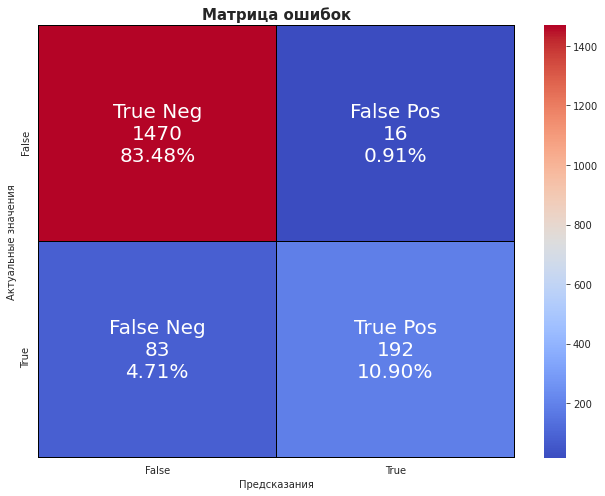


Значение метрики Accuracy:  94.38%
Значение метрики Precision: 92.31%
Значение метрики Recall:    69.82%



In [96]:
# расчет матрицы ошибок
cf_matrix = confusion_matrix(target_test, cbc_mod.predict(features_test))
# формирование надписей
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in cf_matrix.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
# построение матрицы ошибок
plt.figure(figsize=(9, 7))
sns.heatmap(cf_matrix, fmt='', cmap='coolwarm', annot=labels, annot_kws={'size':20}, linewidths=.1, linecolor='black')
plt.title('Матрица ошибок', size=15, fontweight='bold')
plt.xlabel('Предсказания')
plt.ylabel('Актуальные значения')
plt.xticks(ticks=[.5,1.5], labels=['False','True'])
plt.yticks(ticks=[.5,1.5], labels=['False','True'])
plt.tight_layout()
plt.show()

# расчет метрик
print(f'''
Значение метрики Accuracy:  {accuracy_score(target_test, cbc_mod.predict(features_test)):0.2%}
Значение метрики Precision: {precision_score(target_test, cbc_mod.predict(features_test)):0.2%}
Значение метрики Recall:    {recall_score(target_test, cbc_mod.predict(features_test)):0.2%}
''')

Исходя из матрицы ошибок можно сделать следующие выводы:

1. В 94,38% (83,48% + 10,90%) случаев модель правильно предсказывает результат (метрика accuracy).

В выборке имеется дисбаланс классов (клиенты, расторгнувшие договор составляют 15,6%), поэтому положительных значений целевого признака (фактов оттока) в выборке количественно меньше.

2. В тестовой выборке размером 1761 записей модель правильно предсказала:
    - 1470 случаев отсутствия оттока из 1486, что составляет 92,31% (метрика precision);
    - 192 случая оттока из 275, что составляет 69,82% (метрика recall).
    
Модель хорошо предсказывает отсутствие у клиентов склонности к оттоку и хуже предсказывает склонность к оттоку. Сопоставляя это с целью Заказчика прогнозировать отток, возможно, следует доработать модель с целью увеличить метрику recall даже в ущерб другим метрикам.

Поставим приоритетом при обучении лучшей модели CatBoostClassifier метрику recall и посмотрим на результат.

In [136]:
# подбор параметров для модели CatBoostClassifier со скорингом recall

# засекаем время
start_time = time.time()
# список категориальных признаков    
cat_feat = [features_train.columns.get_loc(c) for c in features_train.select_dtypes(include='category')]
# создание модели
model2 = CatBoostClassifier(cat_features=cat_feat, random_seed=RST)
# гипарпараметры для подбора
grid = {
    'learning_rate': [.8],
    'depth': [2],
    'iterations': [600]
    }
# подбор гиперпараметров с использованием кросс-валидации
cbc4_mod = GridSearchCV(model2, param_grid=grid, scoring='recall', cv=5, n_jobs=-1, verbose=2)
cbc4_mod.fit(features_train, target_train)
cbc4_recall = cbc4_mod.best_score_
cbc4_auc_roc = roc_auc_score(target_train, cbc4_mod.predict_proba(features_train)[:, 1])
cbc4_param = cbc4_mod.best_params_
# подсчет времени выполнения
cbc4_time_fit = time.time() - start_time
# вывод результатов
print(f'''
Лучшие гиперпараметры:{pd.DataFrame.from_dict(cbc4_param, orient='index').rename(columns={0:''})}
Значение Recall: {cbc4_recall:0.3f}
Значение AUC-ROC: {cbc4_auc_roc:0.3f}
Время обучения: {cbc4_time_fit:0.1f} сек. ({time.strftime("%H:%M:%S", time.gmtime(cbc4_time_fit))})''')

Fitting 5 folds for each of 1 candidates, totalling 5 fits
0:	learn: 0.4197189	total: 6.99ms	remaining: 4.18s
1:	learn: 0.3942460	total: 12.5ms	remaining: 3.74s
2:	learn: 0.3593197	total: 18ms	remaining: 3.59s
3:	learn: 0.3445785	total: 22.5ms	remaining: 3.36s
4:	learn: 0.3386655	total: 27.7ms	remaining: 3.3s
5:	learn: 0.3338486	total: 32.7ms	remaining: 3.23s
6:	learn: 0.3307685	total: 37.5ms	remaining: 3.18s
7:	learn: 0.3273956	total: 43.4ms	remaining: 3.21s
8:	learn: 0.3259935	total: 54.1ms	remaining: 3.55s
9:	learn: 0.3252963	total: 59.3ms	remaining: 3.5s
10:	learn: 0.3239131	total: 64.2ms	remaining: 3.44s
11:	learn: 0.3228867	total: 79ms	remaining: 3.87s
12:	learn: 0.3219227	total: 84.8ms	remaining: 3.83s
13:	learn: 0.3212308	total: 88.3ms	remaining: 3.69s
14:	learn: 0.3209510	total: 93.3ms	remaining: 3.64s
15:	learn: 0.3195397	total: 97.9ms	remaining: 3.58s
16:	learn: 0.3141043	total: 103ms	remaining: 3.53s
17:	learn: 0.3128606	total: 109ms	remaining: 3.53s
18:	learn: 0.3119784	to

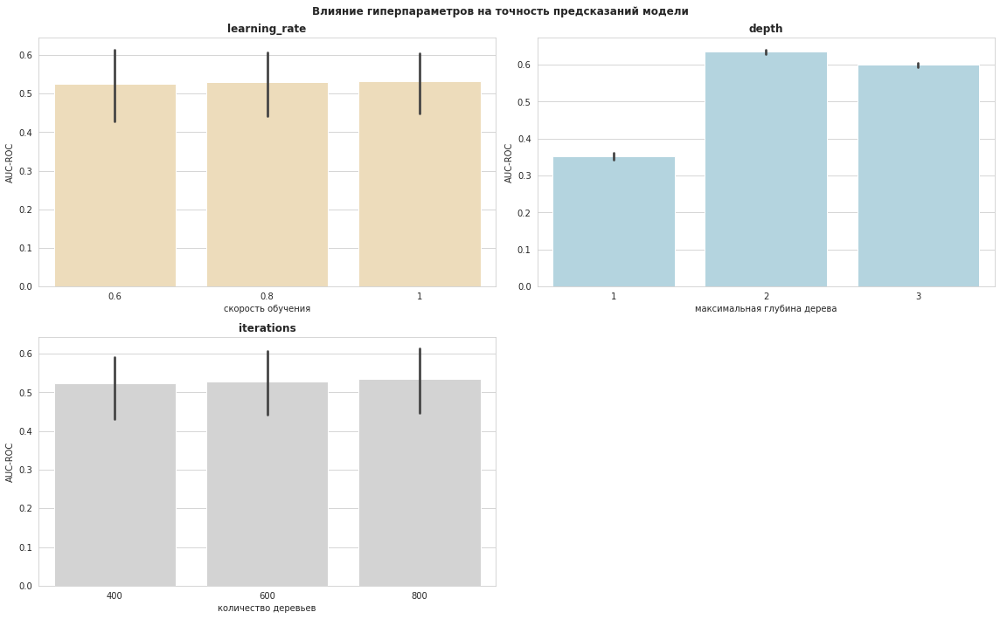

In [130]:
# построение графиков влияния подбираемых гиперпараметров на модель
res_cbc4 = pd.DataFrame(cbc4_mod.cv_results_).sort_values(by='rank_test_score')
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
sns.set_style("whitegrid")
fig.suptitle('Влияние гиперпараметров на точность предсказаний модели', fontweight='bold')
sns.barplot(x='param_learning_rate', y='mean_test_score', data=res_cbc4, ax=axes[0,0], color='wheat')
axes[0,0].set (xlabel='скорость обучения', ylabel='AUC-ROC')
axes[0,0].set_title(label = 'learning_rate', fontweight='bold')
sns.barplot(x='param_depth', y='mean_test_score', data=res_cbc4, ax=axes[0,1], color='lightblue')
axes[0,1].set (xlabel='максимальная глубина дерева', ylabel='AUC-ROC')
axes[0,1].set_title(label = 'depth', fontweight='bold')
sns.barplot(x='param_iterations', y='mean_test_score', data=res_cbc4, ax=axes[1,0], color='lightgrey')
axes[1,0].set (xlabel='количество деревьев', ylabel='AUC-ROC')
axes[1,0].set_title(label = 'iterations', fontweight='bold')
fig.delaxes(axes[1,1])
fig.tight_layout()
plt.show()

In [137]:
# проверка на тестовой выборке
print(f'Значение AUC-ROC на тестовой выборке: {roc_auc_score(target_test, cbc4_mod.predict_proba(features_test)[:, 1]):0.3f}')

Значение AUC-ROC на тестовой выборке: 0.942


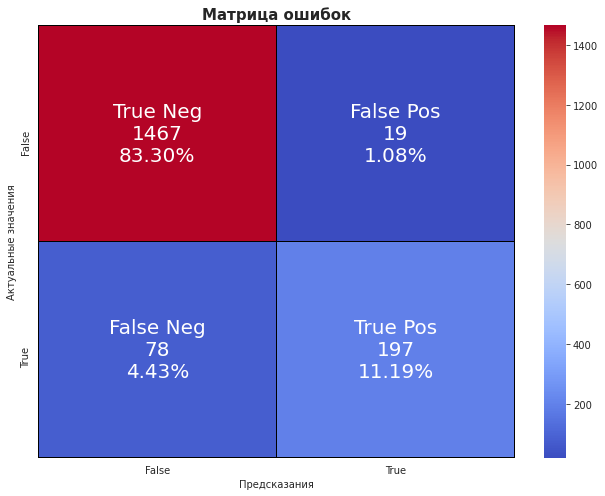


Значение метрики Accuracy:  94.49%
Значение метрики Precision: 91.20%
Значение метрики Recall:    71.64%



In [138]:
# расчет матрицы ошибок
cf_matrix4 = confusion_matrix(target_test, cbc4_mod.predict(features_test))
# формирование надписей
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in cf_matrix4.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in cf_matrix4.flatten()/np.sum(cf_matrix4)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
# построение матрицы ошибок
plt.figure(figsize=(9, 7))
sns.heatmap(cf_matrix4, fmt='', cmap='coolwarm', annot=labels, annot_kws={'size':20}, linewidths=.1, linecolor='black')
plt.title('Матрица ошибок', size=15, fontweight='bold')
plt.xlabel('Предсказания')
plt.ylabel('Актуальные значения')
plt.xticks(ticks=[.5,1.5], labels=['False','True'])
plt.yticks(ticks=[.5,1.5], labels=['False','True'])
plt.tight_layout()
plt.show()

# расчет метрик
print(f'''
Значение метрики Accuracy:  {accuracy_score(target_test, cbc4_mod.predict(features_test)):0.2%}
Значение метрики Precision: {precision_score(target_test, cbc4_mod.predict(features_test)):0.2%}
Значение метрики Recall:    {recall_score(target_test, cbc4_mod.predict(features_test)):0.2%}
''')

Метрику recall удалось увеличить до 71,64% при сохранении значения метрики AUC-ROC на тестовой выборке на уровне 0,942.

### 3.10. <a id='toc3_10_'></a>[Вывод по результатам раздела 3](#toc0_)

В ходе исследования обучено и проанализировано четыре модели разных типов:
- метод опорных векторов `LinearSVC`;
- логистическая регрессия `LogisticRegression`;
- градиентный бустинг `LGBMClassifier`;
- градиентный бустинг `CatBoostClassifier`.

Все модели обучались на одинаково подготовленной выборке (для CatBoostClassifier дополнительно было проведено обучение без предварительного кодирования и масштабирования признаков). Для всех был осуществлен подбор наиболее влияющих на качество предсказаний гиперпараметров. В процессе работы для каждой модели проведены расчеты метрики AUC-ROC и измерение времени на этапе обучения.

Лучшей моделью в соответствии с требованиями Заказчика является модель градиентного бустинга `CatBoostClassifier`.

Данная модель была проверена на тестовой выборке, где показала хорошее качество предсказаний (0,942), соответствующее требованию AUC-ROC > 0,85.

## 4. <a id='toc4_'></a>[Анализ результатов. Общий вывод.](#toc0_)

В ходе реализации проекта были получены и успешно загружены исходные данные, состоящие из 4 таблиц объемом от 5,5 до 7 тысяч строк. Объем полученных данных достаточен для проведения обучения моделей и исследования. Первичный обзор показал необходимость их предварительной обработки.

Составлен рабочий план (размещен отдельной главой в начале проекта), в соответствии с которым проводилось исследование. Основные пункты плана предполагали проведение предобработки данных, выбор и обучение моделей, выявление лучшей модели в соответствии с требованиями Заказчика, анализ результатов исследования и выводы. Все пункты плана в ходе исследования были полностью выполнены.


- В рамках этапа предобработки данных выполнены следующие мероприятия:
  
  - Объединение исходных данных в общий датафрейм с установкой в качестве индекса уникального идентификатора клиента `customer_id`.
  - Унификация названий столбцов.
  - Проверка на наличие дубликатов.
  - Добавление новых и уделение неактуальных признаков:
    - Добавлены бинарные признаки факта наличия у клиента услуг интернет и телефонии.
    - Добавлен расчетный признак время жизни клинта.
    - Удален признак дата расторжения договора, приводящий к утечке данных при обучении моделей.
  - Формирование целевого признака отток клиента `outflow`.
  - Заполнение пропусков в данных.
  - Приведение типов данных в столбцах в соответствии с их содержанием для последующей корректной интерпретации моделями.
  - Анализ уникальных значений дискретных признаков (аномальных значений в данных не зафиксировано).
  - Графический анализ распределений непрерывных признаков:
    - Отклонений и существенных выбросов не обнаружено.
    - Зафиксирована негативная тенденция склонности к оттоку клиентов с более высокими общими и ежемесячными платежами, требующая отдельного исследования.
  - Корреляционный анализ:
    - Зафиксировано наличие сильной положительной корреляции между ежемесячными платежами и признаками наличия услуг, а также между общими платежами и временем жизни клиента. Данные зависимости объяснимы и закономерны, а участвующие в них признаки необходимы для исследования.
    - Обнаружена 100% корреляция между признаком дата заключения договора и целевым признаком оттока, по результатам признак дата заключения договора удален, как приводящий к утечке данных при обучении моделей.
    - Корреляция между остальными признаками и целевым признаком несущественна.
<p>

    
- Итоговый набор данных для обучения моделей содержит 7043 записи и 20 признаков (включая целевой):
  
  - `outflow` - целевой признак оттока;
  - `type` - тип договора;
  - `paperless_billing` - наличие электронного счета за услугу;
  - `payment_method` - способ оплаты услуг;
  - `monthly_charges` - ежемесячные расходы клиента на услуги;
  - `total_charges` - общие расходы клиента на услуги;
  - `lifetime` - время жизни (пользования услугами) клиента;
  - `gender` - пол;
  - `senior_citizen` - признак пенсионного возраста;
  - `partner` - наличие семьи;
  - `dependents` - наличие иждивенцев;
  - `internet_service` - технология подключения интернет;
  - `online_security` - услуга интернет-безопасности;
  - `online_backup` - услуга облачного хранилища;
  - `device_protection` - услуга антивируса;
  - `streaming_tv` - услуга стримингового телевидения;
  - `streaming_movies` - услуга каталог фильмов;
  - `multiple_lines` - услуга нескольких телефонных линий;
  - `internet` - услуга интернет;
  - `phone` - услуга телефонии;
  - `tech_support` - выделенная линия технической поддержки.

  Перед обучением данные были разделены на обучающую и тестовую выборки в соотношении 75/25.
<p>

    
- Для решения поставленной задачи по прогнозированию оттока клиентов (задача бинарной классификации) выбраны четыре модели трех разных типов:

  - опорных векторов `LinearSVC`;
  - логистическая регрессия `LogisticRegression`;
  - градиентный бустинг `LGBMClassifier`;
  - градиентный бустинг `CatBoostClassifier`.
   
  Процесс обучения моделей организован с помощью `Pipeline`, который обеспечивает сквозной процесс и стыковку этапов. Реализован в виде пользовательской функции, включающей в себя:
  - предварительную обработку признаков с применением `ColumnTransformer`:
    - кодирование категориальных признаков с помощью `OneHotEncoder`;
    - масштабирование количественных признаков с помощью `StandardScaler`;
  - подбор гиперпараметров с помощью `GridSearchCV`, включая кросс-валидацию и расчет метрики `AUC-ROC`;
  - измерение времени обучения моделей.
  
  На всех этапах работы с моделями установлен параметр `random_state = 190623`.

  Критерием оценки качества моделей в соответствии с требованиями Заказчика установлена метрика `AUC-ROC > 0,85`. 
<p>

    
- По итогам обучения и анализа качества предсказаний моделей на обучающей/валидационной выборке получены следующие результаты:

  - Модели опорных векторов LinearSVC и логистической регрессии LogisticRegression не обеспечивают выполнение требуемого качества предсказаний по показателю AUC-ROC (значение показателя AUC-ROC около 0,77). 
  - Модели градиентного бустинга LGBMClassifier и CatBoostClassifier обеспечивают выполнение требуемого качества предсказаний по показателю AUC-ROC с определенным запасом. Значение метрики AUC-ROC для модели LGBMClassifier составляет 0,90, для модели CatBoostClassifier - 0,92.
  - Моделью, обеспечивающей лучшее качество предсказаний по метрике AUC-ROC, является модель градиентного бустинга CatBoostClassifier (`AUC-ROC = 0,92`).
  - Модель градиентного бустинга LGBMClassifier показала меньшую точность по сравнению с моделью CatBoostClassifier (0,90 против 0,92), но более высокую скорость обучения.
<p>

    
- Лучшая модель (CatBoostClassifier) проверена на тестовой выборке. Результат предсказаний по метрике `AUC-ROC = 0,94` выше (лучше) требуемого Заказчиком значения. Результаты получены при использовании следующих гиперпараметров:

  - количество деревьев - 600;
  - максимальная глубина дерева - 2;
  - скорость обучения - 0,3.
<p>

    
- Проведен анализ влияния признаков на результат предсказаний лучшей модели (CatBoostClassifier), который выявил следующие закономерности:

  - Преобладающее влияние на результаты модели оказывает признак время жизни клиента.
  - Следующими по степени важности примерно в равной степени являются три признака, связанные с оплатой услуг:
    - общие расходы клиента;
    - ежемесячные расходы клиента;
    - способ оплаты услуг.

    Влияние остальных признаков на предсказания модели горазде менее значительно.
<p>

    
- Проанализирована матрица ошибок, построенная по предсказаниям лучшей модели (CatBoostClassifier) на тестовой выборке. Получены следующие результаты:

  - В 94,38% случаев модель правильно предсказывает результат.
  - В тестовой выборке размером 1761 записей модель правильно предсказала:
    - 1470 случаев отсутствия оттока из 1486, что составляет 92,31%;
    - 192 случая оттока из 275, что составляет 69,82%.
    
  Модель имеет высокую точность предсказаний по метрикам `Accuracy = 94,38%` и `Precision = 92,31%`; удовлетворительную точность по метрике `Recall = 69,82%`. Модель хорошо предсказывает отсутствие склонности к оттоку у клинта, хуже предсказывает склонность к оттоку.

  Дополнительно проведено обучение лучшей модели (CatBoostClassifier) с приоритетом на улучшение метрики Recall. В результате удалось улучшить метрику `Recall` с 69,82% до `71,64%`. При этом сохранено значение метрики `AUC-ROC = 0,94`. Метрики `Accuracy = 94,49%` и `Precision = 91,20%` также имеют высокие значения. Указанные значения метрик получены при использовании следующих гиперпараметров:
  - количество деревьев - 600;
  - максимальная глубина дерева - 2;
  - скорость обучения - 0,8.

  Возможно, следует отдельно проанализировать необходимость дальнейшего увеличения значения метрики Recall, при необходимости, провести соответствующие мероприятия.
<p>

    
В качестве результата исследования для реализации проекта Заказчика `рекомендуется использовать модель градиентного бустинга CatBoostClassifier`, как наиболее соответствующую поставленным требованиям и обеспечивающую самую высокую точность предсказаний по метрике AUC-ROC (`AUC-ROC = 0,94`).  
Дополнительно можно предложить использовать модель градиентного бустинга LGBMClassifier в ситуациях, требующих более высокой скорости и допускающих меньшую, но соответствующую требованиям точность предсказаний по метрике AUC-ROC.